#installing dataset and setting up variables

In [ ]:
!pip install -q rasterio gsutil

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 30.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.3/22.3 MB 45.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.3/212.3 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.6/96.6 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.2/135.2 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 51.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency

In [ ]:
# 1. Create the main directory
!mkdir -p /content/Sen1Floods11_HandLabeled

# 2. Define the base path on the cloud
# This is the messy path we discovered
base_cloud_path = "gs://sen1floods11/v1.1/data/flood_events/HandLabeled"

# 3. Copy ONLY the S1, S2, and Label folders
print("Downloading S1Hand files (raw S1 images)...")
!gsutil -m cp -r {base_cloud_path}/S1Hand /content/Sen1Floods11_HandLabeled/

print("\nDownloading S2Hand files (raw S2 images)...")
!gsutil -m cp -r {base_cloud_path}/S2Hand /content/Sen1Floods11_HandLabeled/

print("\nDownloading LabelHand files (the masks)...")
!gsutil -m cp -r {base_cloud_path}/LabelHand /content/Sen1Floods11_HandLabeled/

print("\n--- Download complete! ---")

# 4. Verify the final size and structure
!du -sh /content/Sen1Floods11_HandLabeled
print("\nVerifying folder contents:")
!ls -l /content/Sen1Floods11_HandLabeled

Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_103757_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_129334_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_195474_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_23014_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_233925_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_242570_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_314919_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_290290_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_294583_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_312675_S1Hand.tif...
Copying gs://sen1floods11/v1.1/

#Separability index and preprocessing

In [ ]:
import numpy as np
from skimage.feature import graycomatrix, graycoprops
import rasterio
import scipy.ndimage as ndi

# ---S2 INDEX FUNCTIONS---
def calculate_indices(s2_bands):
    """
    Calculates key indices from a 13-band Sentinel-2 stack.
    """
    B3 = s2_bands[2].astype(float) #Green
    B4 = s2_bands[3].astype(float) #Red
    B8 = s2_bands[7].astype(float) #NIR
    B11 = s2_bands[11].astype(float) # SWIR

    np.seterr(divide='ignore', invalid='ignore')

    mndwi = (B3 - B11) / (B3 + B11)
    ndwi = (B3 - B8) / (B3 + B8)
    ndvi = (B8 - B4) / (B8 + B4)

    return {
        "S2_MNDWI": np.nan_to_num(mndwi),
        "S2_NDWI": np.nan_to_num(ndwi),
        "S2_NDVI": np.nan_to_num(ndvi)
    }

# --- S1 TEXTURE FUNCTION ---
def calculate_texture_features(band_data, window_size=5):
    """
    Calculates a local standard deviation map as a texture feature.
    """
    # We use generic_filter to apply the np.std (standard deviation)
    # function over a 5x5 square window (footprint).
    footprint = np.ones((window_size, window_size))
    texture_image = ndi.generic_filter(band_data, np.std, footprint=footprint)
    # ----------------------
    return texture_image

# --- SEPARABILITY FUNCTION (No Change) ---
def calculate_separability_index(feature_pixels, mask_pixels):
    """
    Calculates the Separability Index (SI) for a feature.
    """
    flooded_pixels = feature_pixels[mask_pixels == 1]
    non_flooded_pixels = feature_pixels[mask_pixels == 0]

    if len(flooded_pixels) < 2 or len(non_flooded_pixels) < 2:
        return 0

    mean_flood = np.mean(flooded_pixels)
    mean_non_flood = np.mean(non_flooded_pixels)
    std_flood = np.std(flooded_pixels)
    std_non_flood = np.std(non_flooded_pixels)

    epsilon = 1e-6
    separability = np.abs(mean_flood - mean_non_flood) / (std_flood + std_non_flood + epsilon)

    return separability

In [ ]:
import glob
import os
import numpy as np
from collections import Counter
import rasterio

# --- 1. DEFINE CORRECT PATHS ---
base_dir = "/content/Sen1Floods11_HandLabeled"
s1_dir = os.path.join(base_dir, "S1Hand")
s2_dir = os.path.join(base_dir, "S2Hand")
mask_dir = os.path.join(base_dir, "LabelHand")

print(f"S1 Images folder: {s1_dir}")
print(f"S2 Images folder: {s2_dir}")
print(f"Masks folder:     {mask_dir}")

# --- 2. Define Helper Loading Functions ---
def load_s1_image(path):
    with rasterio.open(path) as src:
        return src.read()

def load_s2_image(path):
    with rasterio.open(path) as src:
        return src.read()

def load_single_band_image(path):
    with rasterio.open(path) as src:
        return src.read(1)

# --- 3. Find and Pair Files ---
mask_files = glob.glob(os.path.join(mask_dir, "**/*.tif"), recursive=True)
print(f"\nFound {len(mask_files)} potential mask files.")

s1_files = []
s2_files = []
paired_mask_files = []

for mask_file in mask_files:
    try:
        full_base_name = os.path.basename(mask_file)
        base_name = full_base_name.replace("LabelHand.tif", "")

        s1_file = os.path.join(s1_dir, f"{base_name}S1Hand.tif")
        s2_file = os.path.join(s2_dir, f"{base_name}S2Hand.tif")

        if os.path.exists(s1_file) and os.path.exists(s2_file):
            s1_files.append(s1_file)
            s2_files.append(s2_file)
            paired_mask_files.append(mask_file)

    except Exception as e:
        print(f"Error processing mask file {os.path.basename(mask_file)}: {e}")

# --- 4. Verify Paired Files ---
print(f"Successfully paired {len(s1_files)} sets of S1/S2/Mask data.")

paired_data_found = False
if len(s1_files) == len(s2_files) == len(paired_mask_files) and len(s1_files) > 0:
    print("Paired file counts match. Ready to proceed.")
    paired_data_found = True
else:
    print("WARNING: The number of paired files does not match or is zero! Check paths.")

# --- 5. Main Loop to Gather Pixel Data (MODIFIED) ---
if paired_data_found:

    # --- ADDED TEXTURE FEATURES TO THE LIST ---
    all_feature_names = [
        "S1_VV", "S1_VH",
        "S2_MNDWI", "S2_NDWI", "S2_NDVI",
        "S1_VV_StdDev", "S1_VH_StdDev"
    ]
    all_feature_data = {name: [] for name in all_feature_names}
    all_mask_data = []

    print("\nGathering pixel data from paired images...")

    sample_size = min(5, len(paired_mask_files))

    paired_files_sample = list(zip(s1_files, s2_files, paired_mask_files))[:sample_size]
    print(f"Processing a sample of {sample_size} image sets...")

    for s1_path, s2_path, mask_path in paired_files_sample:
        try:
            s1_image = load_s1_image(s1_path)
            s2_image = load_s2_image(s2_path)
            mask = load_single_band_image(mask_path)

            indices = calculate_indices(s2_image)

            # Clean S1 bands
            s1_vv_band = np.nan_to_num(s1_image[0])
            s1_vh_band = np.nan_to_num(s1_image[1])

            # --- CALCULATE NEW TEXTURE FEATURES ---
            s1_vv_texture = calculate_texture_features(s1_vv_band)
            s1_vh_texture = calculate_texture_features(s1_vh_band)

            # --- Store all data ---
            all_mask_data.append(mask.flatten())

            # Original S1 features
            all_feature_data["S1_VV"].append(s1_vv_band.flatten())
            all_feature_data["S1_VH"].append(s1_vh_band.flatten())

            # S2 indices
            all_feature_data["S2_MNDWI"].append(indices["S2_MNDWI"].flatten())
            all_feature_data["S2_NDWI"].append(indices["S2_NDWI"].flatten())
            all_feature_data["S2_NDVI"].append(indices["S2_NDVI"].flatten())

            # New S1 Texture features
            all_feature_data["S1_VV_StdDev"].append(s1_vv_texture.flatten())
            all_feature_data["S1_VH_StdDev"].append(s1_vh_texture.flatten())

        except Exception as e:
            print(f"Error processing files: {e}")

    # --- 6. Concatenate and Analyze (No Change Needed) ---
    if all_mask_data:
        print("\nConcatenating all pixel data...")
        full_mask = np.concatenate(all_mask_data)
        unique_mask_values = np.unique(full_mask)
        print(f"Mask values found: {unique_mask_values}")

        if 0 not in unique_mask_values or 1 not in unique_mask_values:
            print("ERROR: Combined masks do not contain both 0 and 1.")
        else:
            print("\nCalculating final separability...")
            separability_scores = {}

            for name, data_list in all_feature_data.items():
                if data_list:
                    full_feature = np.concatenate(data_list)
                    valid_indices = np.isin(full_mask, [0, 1])

                    score = calculate_separability_index(full_feature[valid_indices], full_mask[valid_indices])
                    separability_scores[name] = score

            print("\n--- Feature Separability Scores ---")
            for name, score in sorted(separability_scores.items(), key=lambda item: item[1], reverse=True):
                print(f"{name}: {score:.4f}")

            separability_threshold = 0.5
            selected_features = [name for name, score in separability_scores.items() if score > separability_threshold]
            print(f"\n--- Selected Features (SI > {separability_threshold}) ---")
            print(selected_features)
    else:
        print("\nNo pixel data was gathered from the sample.")
else:
    print("\nSkipping feature extraction: No paired data was found.")

S1 Images folder: /content/Sen1Floods11_HandLabeled/S1Hand
S2 Images folder: /content/Sen1Floods11_HandLabeled/S2Hand
Masks folder:     /content/Sen1Floods11_HandLabeled/LabelHand

Found 446 potential mask files.
Successfully paired 446 sets of S1/S2/Mask data.
Paired file counts match. Ready to proceed.

Gathering pixel data from paired images...
Processing a sample of 5 image sets...

Concatenating all pixel data...
Mask values found: [-1  0  1]

Calculating final separability...

--- Feature Separability Scores ---
S2_MNDWI: 1.6028
S2_NDWI: 1.4378
S2_NDVI: 1.2014
S1_VV: 1.0757
S1_VH: 1.0343
S1_VH_StdDev: 0.8182
S1_VV_StdDev: 0.3463

--- Selected Features (SI > 0.5) ---
['S1_VV', 'S1_VH', 'S2_MNDWI', 'S2_NDWI', 'S2_NDVI', 'S1_VH_StdDev']


In [ ]:
import glob
import os
from tqdm import tqdm
from rasterio.transform import from_origin

# --- 1. Find and Pair Main Files ---
base_dir = "/content/Sen1Floods11_HandLabeled"
s1_dir = os.path.join(base_dir, "S1Hand")
s2_dir = os.path.join(base_dir, "S2Hand")
mask_dir = os.path.join(base_dir, "LabelHand")

mask_files = glob.glob(os.path.join(mask_dir, "**/*.tif"), recursive=True)
s1_files = []
s2_files = []
paired_mask_files = []

for mask_file in mask_files:
    try:
        full_base_name = os.path.basename(mask_file)
        base_name = full_base_name.replace("LabelHand.tif", "")
        s1_file = os.path.join(s1_dir, f"{base_name}S1Hand.tif")
        s2_file = os.path.join(s2_dir, f"{base_name}S2Hand.tif")
        if os.path.exists(s1_file) and os.path.exists(s2_file):
            s1_files.append(s1_file)
            s2_files.append(s2_file)
            paired_mask_files.append(mask_file)
    except Exception as e:
        print(f"Error processing mask file {os.path.basename(mask_file)}: {e}")

print(f"Successfully paired {len(s1_files)} sets of S1/S2/Mask data.")

# --- 2. Pre-process and Save Texture Files ---
print("Starting pre-processing for texture features...")
texture_dir = os.path.join(base_dir, "S1_VH_Texture_Preprocessed")
os.makedirs(texture_dir, exist_ok=True)
print(f"Created directory: {texture_dir}")

for s1_path in tqdm(s1_files, desc="Processing texture"):
    try:
        with rasterio.open(s1_path) as src:
            s1_image = src.read()
            transform = src.transform
            crs = src.crs

        s1_vh_band = np.nan_to_num(s1_image[1])
        texture_image = calculate_texture_features(s1_vh_band)

        base_name = os.path.basename(s1_path)
        new_name = base_name.replace("S1Hand.tif", "S1VHTexture.tif")
        save_path = os.path.join(texture_dir, new_name)

        with rasterio.open(
            save_path, 'w', driver='GTiff',
            height=texture_image.shape[0], width=texture_image.shape[1],
            count=1, dtype=texture_image.dtype, crs=crs, transform=transform,
        ) as dst:
            dst.write(texture_image, 1)
    except Exception as e:
        print(f"Error processing {s1_path}: {e}")

print("\n--- Texture pre-processing complete! ---")

Successfully paired 446 sets of S1/S2/Mask data.
Starting pre-processing for texture features...
Created directory: /content/Sen1Floods11_HandLabeled/S1_VH_Texture_Preprocessed


Processing texture: 100%|██████████| 446/446 [45:27<00:00,  6.11s/it]


--- Texture pre-processing complete! ---


In [ ]:
from sklearn.model_selection import train_test_split

# 1. Find all our new texture files
texture_dir = "/content/Sen1Floods11_HandLabeled/S1_VH_Texture_Preprocessed"
texture_files = glob.glob(os.path.join(texture_dir, "**/*.tif"), recursive=True)

# 2. Sort all lists to ensure they are 100% aligned
s1_files.sort()
s2_files.sort()
paired_mask_files.sort()
texture_files.sort()

# 3. Split all 4 lists together
(
    s1_train_files, s1_val_files,
    s2_train_files, s2_val_files,
    mask_train_files, mask_val_files,
    texture_train_files, texture_val_files
) = train_test_split(
    s1_files, s2_files, paired_mask_files, texture_files,
    test_size=0.2, random_state=42
)

print(f"Total files:    {len(s1_files)}")
print(f"Training files:   {len(s1_train_files)}")
print(f"Validation files: {len(s1_val_files)}")
print(f"Total texture files found: {len(texture_files)}")

Total files:    446
Training files:   356
Validation files: 90
Total texture files found: 446


#Data Preprocessing Visulaization

Searching for India-specific images...
Found 68 India-specific images. Plotting 5 samples...


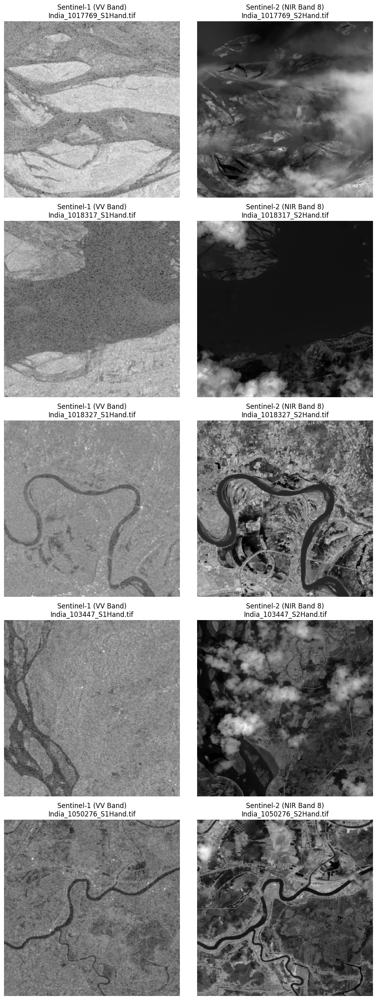

In [ ]:
import matplotlib.pyplot as plt
import rasterio
import os

print("Searching for India-specific images...")

# --- 1. Filter for India Files ---
# We loop through all 446 paired files and save only the ones with "India" in the name
india_files = []
for s1_path, s2_path in zip(s1_files, s2_files):
    # Check the basename of the file (e.g., "India_1017769_S1Hand.tif")
    if "India" in os.path.basename(s1_path):
        india_files.append((s1_path, s2_path))

if not india_files:
    print("No files found containing 'India'. Please check file paths.")
else:
    print(f"Found {len(india_files)} India-specific images. Plotting 5 samples...")

    # --- 2. Plot the first 5 India images ---
    num_images = min(5, len(india_files))

    # Create a figure with 5 rows and 2 columns
    fig, axes = plt.subplots(num_images, 2, figsize=(10, 25))

    # Ensure axes is always a 2D array, even if num_images is 1
    if num_images == 1:
        axes = [axes]

    for i in range(num_images):
        s1_path, s2_path = india_files[i]

        # --- Plot Sentinel-1 (Left Column) ---
        with rasterio.open(s1_path) as src:
            # S1 file has 2 bands (0=VV, 1=VH). We'll show the VV band (band 1).
            s1_vv_band = src.read(1)

            ax = axes[i, 0]
            ax.imshow(s1_vv_band, cmap='gray')
            ax.set_title(f"Sentinel-1 (VV Band)\n{os.path.basename(s1_path)}")
            ax.set_axis_off()

        # --- Plot Sentinel-2 (Right Column) ---
        with rasterio.open(s2_path) as src:
            # S2 file has 13 bands. We'll show Band 8 (NIR), which is good for visuals.
            s2_nir_band = src.read(8)

            ax = axes[i, 1]
            ax.imshow(s2_nir_band, cmap='gray')
            ax.set_title(f"Sentinel-2 (NIR Band 8)\n{os.path.basename(s2_path)}")
            ax.set_axis_off()

    plt.tight_layout()
    plt.show()

Plotting 5 samples of S2 (True Color) vs. MNDWI...


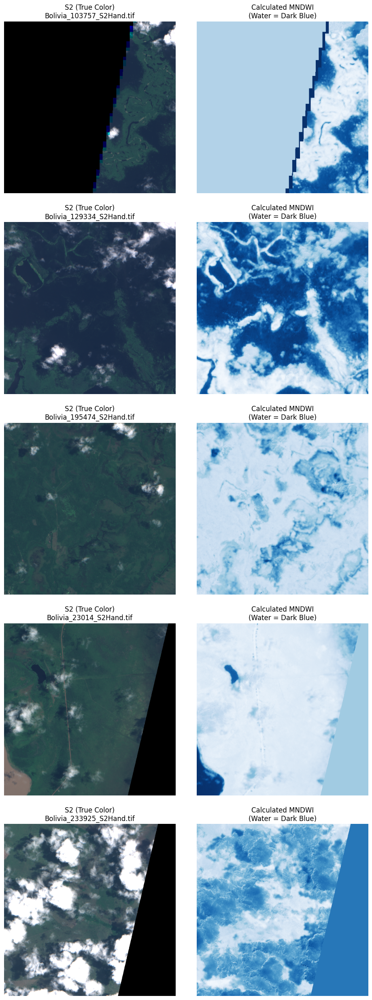

In [ ]:
import matplotlib.pyplot as plt
import rasterio
import os
import numpy as np

# --- Helper function to make S2 images viewable ---
def normalize_for_plot(band_data):
    """Scales band data from 0-1 for plotting."""
    max_val = 3000
    img = np.clip(band_data, 0, max_val)
    return img / max_val

# --- 1. Setup Plot ---
num_images = 5
# (Uses s2_files list from the previous Cell 4)
image_files_sample = s2_files[:num_images] # Get the first 5 S2 files

fig, axes = plt.subplots(num_images, 2, figsize=(10, 25))
print(f"Plotting 5 samples of S2 (True Color) vs. MNDWI...")

for i in range(num_images):
    s2_path = image_files_sample[i]
    ax1 = axes[i, 0]
    ax2 = axes[i, 1]

    try:
        # --- 2. Load and Process ---
        with rasterio.open(s2_path) as src:
            s2_image_13band = src.read()

        # (Uses calculate_indices function from Cell 3)
        indices = calculate_indices(s2_image_13band)
        mndwi_image = indices["S2_MNDWI"]

        # Create True Color (RGB) Image
        rgb_composite = np.stack([
            s2_image_13band[3], # Red
            s2_image_13band[2], # Green
            s2_image_13band[1]  # Blue
        ], axis=-1)
        rgb_plot = normalize_for_plot(rgb_composite)

        # --- 3. Plot ---
        ax1.imshow(rgb_plot)
        ax1.set_title(f"S2 (True Color)\n{os.path.basename(s2_path)}")
        ax1.set_axis_off()

        im = ax2.imshow(mndwi_image, cmap='Blues')
        ax2.set_title(f"Calculated MNDWI\n(Water = Dark Blue)")
        ax2.set_axis_off()

    except Exception as e:
        ax1.set_title(f"Error loading {os.path.basename(s2_path)}: {e}")
        ax1.set_axis_off()
        ax2.set_axis_off()

plt.tight_layout(pad=2.0)
plt.show()

Plotting 5 samples of S2 (True Color) vs. NDWI...


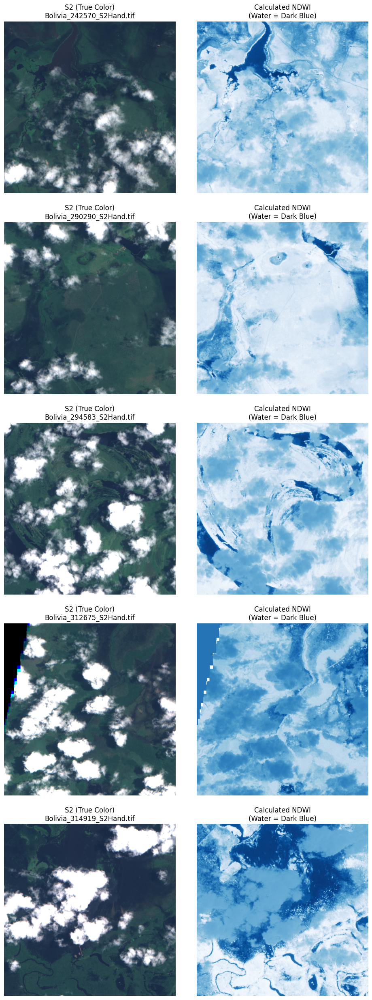

In [ ]:
import matplotlib.pyplot as plt
import rasterio
import os
import numpy as np

# --- Helper function (if not already defined) ---
def normalize_for_plot(band_data):
    max_val = 3000
    img = np.clip(band_data, 0, max_val)
    return img / max_val

# --- 1. Setup Plot ---
num_images = 5
# (Uses s2_files list)
# Get the *next* 5 S2 files (index 5 to 10)
image_files_sample = s2_files[5:10]

fig, axes = plt.subplots(num_images, 2, figsize=(10, 25))
print(f"Plotting 5 samples of S2 (True Color) vs. NDWI...")

for i in range(num_images):
    s2_path = image_files_sample[i]
    ax1 = axes[i, 0]
    ax2 = axes[i, 1]

    try:
        # --- 2. Load and Process ---
        with rasterio.open(s2_path) as src:
            s2_image_13band = src.read()

        # (Uses calculate_indices function)
        indices = calculate_indices(s2_image_13band)
        ndwi_image = indices["S2_NDWI"]

        # Create True Color (RGB) Image
        rgb_composite = np.stack([
            s2_image_13band[3], # Red
            s2_image_13band[2], # Green
            s2_image_13band[1]  # Blue
        ], axis=-1)
        rgb_plot = normalize_for_plot(rgb_composite)

        # --- 3. Plot ---
        ax1.imshow(rgb_plot)
        ax1.set_title(f"S2 (True Color)\n{os.path.basename(s2_path)}")
        ax1.set_axis_off()

        im = ax2.imshow(ndwi_image, cmap='Blues')
        ax2.set_title(f"Calculated NDWI\n(Water = Dark Blue)")
        ax2.set_axis_off()

    except Exception as e:
        ax1.set_title(f"Error loading {os.path.basename(s2_path)}: {e}")
        ax1.set_axis_off()
        ax2.set_axis_off()

plt.tight_layout(pad=2.0)
plt.show()

Plotting 5 samples of S1 (VV Band) vs. VV/VH Ratio...


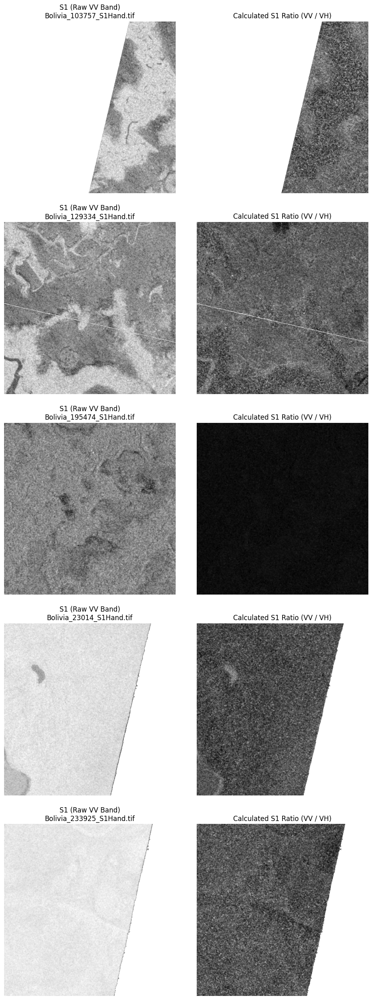

In [ ]:
import matplotlib.pyplot as plt
import rasterio
import os
import numpy as np

# --- 1. Setup Plot ---
num_images = 5
# (Uses s1_files list from the previous Cell 4)
image_files_sample = s1_files[:num_images] # Get the first 5 S1 files

fig, axes = plt.subplots(num_images, 2, figsize=(10, 25))
print(f"Plotting 5 samples of S1 (VV Band) vs. VV/VH Ratio...")

for i in range(num_images):
    s1_path = image_files_sample[i]
    ax1 = axes[i, 0]
    ax2 = axes[i, 1]

    try:
        # --- 2. Load and Process ---
        with rasterio.open(s1_path) as src:
            s1_image_2band = src.read()

        # S1 Bands: VV=0, VH=1
        s1_vv = s1_image_2band[0].astype(float)
        s1_vh = s1_image_2band[1].astype(float)

        # Calculate Ratio Feature
        epsilon = 1e-6
        s1_ratio = s1_vv / (s1_vh + epsilon)

        # --- 3. Plot ---
        ax1.imshow(s1_vv, cmap='gray')
        ax1.set_title(f"S1 (Raw VV Band)\n{os.path.basename(s1_path)}")
        ax1.set_axis_off()

        # We clip the ratio for better visualization
        im = ax2.imshow(np.clip(s1_ratio, 0, 10), cmap='gray')
        ax2.set_title(f"Calculated S1 Ratio (VV / VH)")
        ax2.set_axis_off()

    except Exception as e:
        ax1.set_title(f"Error loading {os.path.basename(s1_path)}: {e}")
        ax1.set_axis_off()
        ax2.set_axis_off()

plt.tight_layout(pad=2.0)
plt.show()

Plotting 5 samples of S1 (Raw VH Band) vs. Texture (StdDev)...


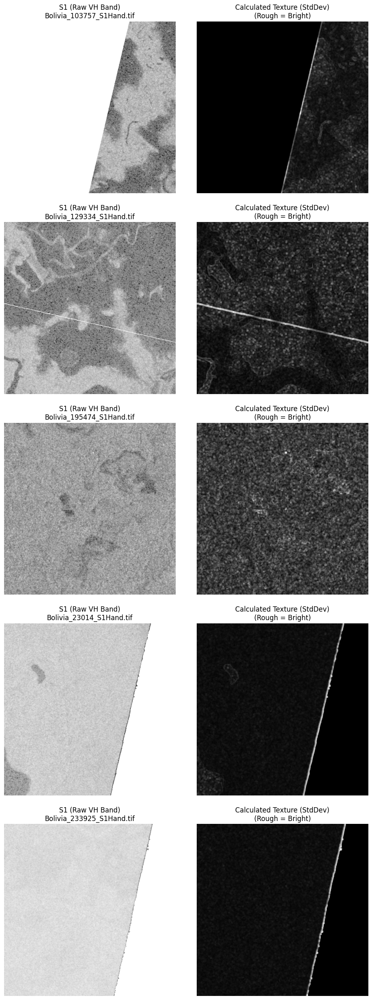

In [ ]:
import matplotlib.pyplot as plt
import rasterio
import os
import numpy as np

# --- 1. Setup Plot ---
num_images = 5
# (Uses s1_files list from the previous Cell 4)
image_files_sample = s1_files[:num_images] # Get the first 5 S1 files

fig, axes = plt.subplots(num_images, 2, figsize=(10, 25))
print(f"Plotting 5 samples of S1 (Raw VH Band) vs. Texture (StdDev)...")

for i in range(num_images):
    s1_path = image_files_sample[i]
    ax1 = axes[i, 0]
    ax2 = axes[i, 1]

    try:
        # --- 2. Load and Process ---
        with rasterio.open(s1_path) as src:
            s1_image_2band = src.read()

        # Clean the S1 bands (just like in our analysis cell)
        # We'll visualize the VH band (index 1)
        s1_vh_band = np.nan_to_num(s1_image_2band[1])

        # Calculate the texture (uses function from Cell 3)
        texture_image = calculate_texture_features(s1_vh_band)

        # --- 3. Plot ---
        ax1.imshow(s1_vh_band, cmap='gray')
        ax1.set_title(f"S1 (Raw VH Band)\n{os.path.basename(s1_path)}")
        ax1.set_axis_off()

        # Plot the texture map
        im = ax2.imshow(texture_image, cmap='gray')
        ax2.set_title(f"Calculated Texture (StdDev)\n(Rough = Bright)")
        ax2.set_axis_off()

    except Exception as e:
        ax1.set_title(f"Error loading {os.path.basename(s1_path)}: {e}")
        ax1.set_axis_off()
        ax2.set_axis_off()

plt.tight_layout(pad=2.0)
plt.show()

#Baseline SVM

In [ ]:
import numpy as np
from sklearn.utils import shuffle

# (Assumes all file lists and functions are in memory)

X_samples = []
y_samples = []

num_images_to_sample = 25
pixels_per_image = 2000

print(f"Sampling {pixels_per_image} random pixels from {num_images_to_sample} images (with 3 features)...")

for i in range(num_images_to_sample):
    # 1. Load data
    s2_image = load_s2_image(s2_train_files[i])
    mask = load_single_band_image(mask_train_files[i])
    # No S1 or texture needed

    # 2. Create the 3-feature 'X' data
    indices = calculate_indices(s2_image)

    X_full = np.stack([
        indices["S2_MNDWI"],
        indices["S2_NDWI"],
        indices["S2_NDVI"]
    ], axis=0) # Shape (3, 512, 512)

    # 3. Flatten and filter
    X_flat = X_full.reshape(3, -1).T # Now 3 features
    y_flat = mask.flatten()
    valid_indices = (y_flat != -1)
    X_valid = X_flat[valid_indices]
    y_valid = y_flat[valid_indices]

    # 4. Take a *random* sample
    X_shuffled, y_shuffled = shuffle(X_valid, y_valid, random_state=42)
    X_samples.append(X_shuffled[:pixels_per_image])
    y_samples.append(y_shuffled[:pixels_per_image])

# 5. Combine all samples
X_train_svm_3 = np.vstack(X_samples)
y_train_svm_3 = np.concatenate(y_samples)

print("\n--- Data Ready for SVM (3 Features) ---")
print(f"X (features) table shape: {X_train_svm_3.shape}")
print(f"y (labels) vector shape:  {y_train_svm_3.shape}")

Sampling 2000 random pixels from 25 images (with 3 features)...

--- Data Ready for SVM (3 Features) ---
X (features) table shape: (50000, 3)
y (labels) vector shape:  (50000,)


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

print("Training SVM classifier (with 3 features and class_weight)...")

# 1. Create a pipeline
svm_pipeline_3 = Pipeline([
    ('scaler', StandardScaler()),
    ('svm', SVC(kernel='rbf', C=1.0, gamma='scale',
                class_weight='balanced',
                random_state=42))
])

# 2. Train the model
svm_pipeline_3.fit(X_train_svm_3, y_train_svm_3)

print("--- SVM Training Complete! ---")

Training SVM classifier (with 3 features and class_weight)...
--- SVM Training Complete! ---


Testing SVM (3 features) on a good validation image...

--- Classification Report (SVM, 3 Features) ---
                 precision    recall  f1-score   support

Not Flooded (0)       1.00      0.97      0.98    225493
    Flooded (1)       0.82      0.99      0.90     36649

       accuracy                           0.97    262142
      macro avg       0.91      0.98      0.94    262142
   weighted avg       0.97      0.97      0.97    262142



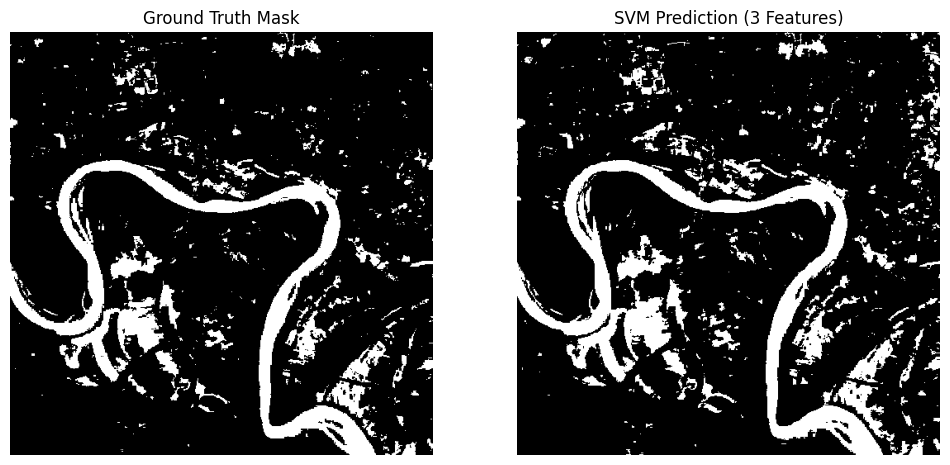

In [ ]:
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

print("Testing SVM (3 features) on a good validation image...")

# Find a good test image (one with floods)
test_index = 4
#for i, mask_path in enumerate(mask_val_files):
 #   mask_check = load_single_band_image(mask_path)
  #  if 1 in np.unique(mask_check):
   #     test_index = i
    #    print(f"Found a good test image at validation index: {test_index}")
     #   break

if test_index != -1:
    # 1. Load the good validation image
    s2_image_val = load_s2_image(s2_val_files[test_index])
    mask_val = load_single_band_image(mask_val_files[test_index])

    # 2. Create the 3-feature 'X' data
    indices_val = calculate_indices(s2_image_val)

    X_test_image = np.stack([
        indices_val["S2_MNDWI"], indices_val["S2_NDWI"], indices_val["S2_NDVI"]
    ], axis=0)

    # 3. Flatten
    X_test_flat = X_test_image.reshape(3, -1).T

    # 4. Predict
    y_pred_flat = svm_pipeline_3.predict(X_test_flat)

    # 5. Reshape back to an image
    y_pred_image = y_pred_flat.reshape(512, 512)

    # 6. Get the true, clean label
    y_true_image = np.clip(mask_val, 0, 1)

    # 7. Print a performance report
    valid_indices = (mask_val.flatten() != -1)
    print("\n--- Classification Report (SVM, 3 Features) ---")
    print(classification_report(mask_val.flatten()[valid_indices], y_pred_flat[valid_indices], target_names=['Not Flooded (0)', 'Flooded (1)']))

    # 8. Plot the results
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    ax1.imshow(y_true_image, cmap='gray')
    ax1.set_title("Ground Truth Mask")
    ax1.set_axis_off()
    ax2.imshow(y_pred_image, cmap='gray')
    ax2.set_title("SVM Prediction (3 Features)")
    ax2.set_axis_off()
    plt.show()
else:
    print("ERROR: No validation images found with flooded pixels.")

In [ ]:
from sklearn.metrics import classification_report
from sklearn.utils import shuffle
from tqdm import tqdm
import numpy as np

print("Running FAST evaluation on all 90 validation images (SVM, 3 Features)...")

all_true_labels = []
all_pred_labels = []

# How many pixels to test per image?
# 10,000 pixels * 90 images = 900,000 total test points (Reliable & Fast)
pixels_per_image_eval = 10000

for i in tqdm(range(len(s1_val_files)), desc="Validating SVM (3-Feat)"):
    try:
        # 1. Load data (Only need S2 and Mask)
        s2_image = load_s2_image(s2_val_files[i])
        mask = load_single_band_image(mask_val_files[i])

        # 2. Calculate Features
        indices = calculate_indices(s2_image)

        # 3. Stack ONLY the 3 features
        X_test_image = np.stack([
            indices["S2_MNDWI"],
            indices["S2_NDWI"],
            indices["S2_NDVI"]
        ], axis=0)

        # 4. Flatten
        X_test_flat = X_test_image.reshape(3, -1).T
        y_true_flat = mask.flatten()

        # 5. Filter valid pixels
        valid_indices = (y_true_flat != -1)
        X_valid = X_test_flat[valid_indices]
        y_valid = y_true_flat[valid_indices]

        # --- Subsample for Speed ---
        if len(y_valid) > pixels_per_image_eval:
            X_valid, y_valid = shuffle(X_valid, y_valid, random_state=42)
            X_valid = X_valid[:pixels_per_image_eval]
            y_valid = y_valid[:pixels_per_image_eval]

        # 6. Predict (Using the 3-feature model)
        if len(y_valid) > 0:
            y_pred_flat = svm_pipeline_3.predict(X_valid)

            all_true_labels.append(y_valid)
            all_pred_labels.append(y_pred_flat)

    except Exception as e:
        print(f"Error processing index {i}: {e}")

# 7. Combine
final_true = np.concatenate(all_true_labels)
final_pred = np.concatenate(all_pred_labels)

# 8. Print Report
print("\n--- FINAL SVM CLASSIFICATION REPORT (3 Features, Fast Validation) ---")
print(classification_report(final_true, final_pred, target_names=['Not Flooded (0)', 'Flooded (1)']))

Running FAST evaluation on all 90 validation images (SVM, 3 Features)...


Validating SVM (3-Feat): 100%|██████████| 90/90 [03:25<00:00,  2.28s/it]



--- FINAL SVM CLASSIFICATION REPORT (3 Features, Fast Validation) ---
                 precision    recall  f1-score   support

Not Flooded (0)       0.99      0.98      0.98    809666
    Flooded (1)       0.80      0.94      0.86     82226

       accuracy                           0.97    891892
      macro avg       0.89      0.96      0.92    891892
   weighted avg       0.98      0.97      0.97    891892



#SVM

In [ ]:
import numpy as np
from sklearn.utils import shuffle

X_samples = []
y_samples = []

num_images_to_sample = 25
pixels_per_image = 2000

print(f"Sampling {pixels_per_image} random pixels from {num_images_to_sample} images (with 6 features)...")

for i in range(num_images_to_sample):
    # Load all 4 data sources
    s1_image = load_s1_image(s1_train_files[i])
    s2_image = load_s2_image(s2_train_files[i])
    mask = load_single_band_image(mask_train_files[i])
    texture = load_single_band_image(texture_train_files[i]) # Load pre-processed texture

    # Create the 6-feature 'X' data
    indices = calculate_indices(s2_image)
    s1_vv = np.nan_to_num(s1_image[0])
    s1_vh = np.nan_to_num(s1_image[1])

    X_full = np.stack([
        s1_vv, s1_vh,
        indices["S2_MNDWI"], indices["S2_NDWI"], indices["S2_NDVI"],
        texture # Use the loaded texture file
    ], axis=0)

    # Flatten and filter
    X_flat = X_full.reshape(6, -1).T
    y_flat = mask.flatten()
    valid_indices = (y_flat != -1)
    X_valid = X_flat[valid_indices]
    y_valid = y_flat[valid_indices]

    # Take a *random* sample
    X_shuffled, y_shuffled = shuffle(X_valid, y_valid, random_state=42)
    X_samples.append(X_shuffled[:pixels_per_image])
    y_samples.append(y_shuffled[:pixels_per_image])

# Combine all samples
X_train_svm_6 = np.vstack(X_samples)
y_train_svm_6 = np.concatenate(y_samples)

print("\n--- Data Ready for SVM (6 Features) ---")
print(f"X (features) table shape: {X_train_svm_6.shape}")
print(f"y (labels) vector shape:  {y_train_svm_6.shape}")

Sampling 2000 random pixels from 25 images (with 6 features)...

--- Data Ready for SVM (6 Features) ---
X (features) table shape: (50000, 6)
y (labels) vector shape:  (50000,)


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

print("Training SVM classifier (with 6 features and class_weight)...")

# Create a pipeline
svm_pipeline_6 = Pipeline([
    ('scaler', StandardScaler()),
    ('svm', SVC(kernel='rbf', C=1.0, gamma='scale',
                class_weight='balanced',
                random_state=42))
])

# Train the model
svm_pipeline_6.fit(X_train_svm_6, y_train_svm_6)

print("--- SVM Training Complete! ---")

Training SVM classifier (with 6 features and class_weight)...
--- SVM Training Complete! ---


Testing SVM (6 features) on a good validation image...

--- Classification Report (SVM, 6 Features) ---
                 precision    recall  f1-score   support

Not Flooded (0)       1.00      0.96      0.98    225493
    Flooded (1)       0.78      0.98      0.87     36649

       accuracy                           0.96    262142
      macro avg       0.89      0.97      0.92    262142
   weighted avg       0.97      0.96      0.96    262142



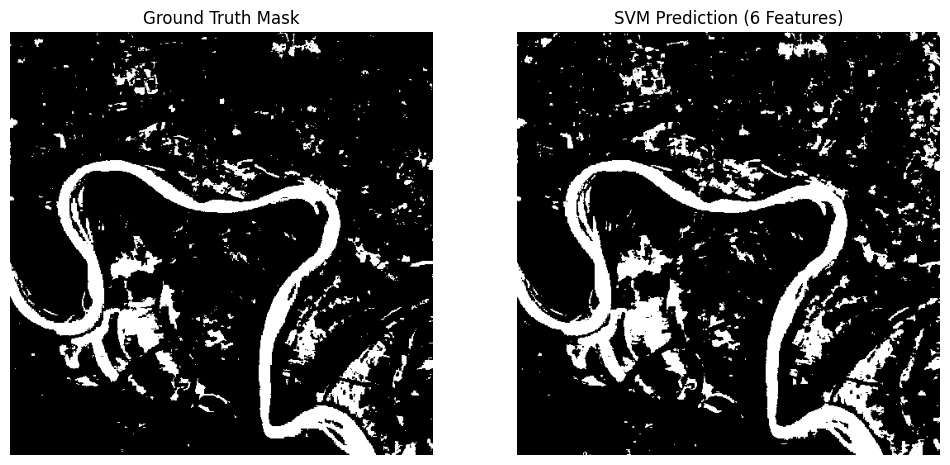

In [ ]:
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

print("Testing SVM (6 features) on a good validation image...")

# Find a good test image (one with floods)
test_index = 4
#for i, mask_path in enumerate(mask_val_files):
 #   mask_check = load_single_band_image(mask_path)
  #  if 1 in np.unique(mask_check):
   #     test_index = i
    #    print(f"Found a good test image at validation index: {test_index}")
     #   break

if test_index != -1:
    # 1. Load the good validation image
    s1_image_val = load_s1_image(s1_val_files[test_index])
    s2_image_val = load_s2_image(s2_val_files[test_index])
    mask_val = load_single_band_image(mask_val_files[test_index])
    texture_val = load_single_band_image(texture_val_files[test_index]) # Load texture

    # 2. Create the 6-feature 'X' data
    indices_val = calculate_indices(s2_image_val)
    s1_vv_val = np.nan_to_num(s1_image_val[0])
    s1_vh_val = np.nan_to_num(s1_image_val[1])

    X_test_image = np.stack([
        s1_vv_val, s1_vh_val,
        indices_val["S2_MNDWI"], indices_val["S2_NDWI"], indices_val["S2_NDVI"],
        texture_val
    ], axis=0)

    # 3. Flatten
    X_test_flat = X_test_image.reshape(6, -1).T

    # 4. Predict
    y_pred_flat = svm_pipeline_6.predict(X_test_flat)

    # 5. Reshape back to an image
    y_pred_image = y_pred_flat.reshape(512, 512)

    # 6. Get the true, clean label
    y_true_image = np.clip(mask_val, 0, 1)

    # 7. Print a performance report
    valid_indices = (mask_val.flatten() != -1)
    print("\n--- Classification Report (SVM, 6 Features) ---")
    print(classification_report(mask_val.flatten()[valid_indices], y_pred_flat[valid_indices], target_names=['Not Flooded (0)', 'Flooded (1)']))

    # 8. Plot the results
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    ax1.imshow(y_true_image, cmap='gray')
    ax1.set_title("Ground Truth Mask")
    ax1.set_axis_off()
    ax2.imshow(y_pred_image, cmap='gray')
    ax2.set_title("SVM Prediction (6 Features)")
    ax2.set_axis_off()
    plt.show()
else:
    print("ERROR: No validation images found with flooded pixels.")

In [ ]:
from sklearn.metrics import classification_report
from sklearn.utils import shuffle
from tqdm import tqdm
import numpy as np

print("Running FAST evaluation on all 90 validation images (SVM, Subsampled)...")

all_true_labels = []
all_pred_labels = []

# How many pixels to test per image?
# 10,000 pixels * 90 images = 900,000 total test points (Very reliable)
pixels_per_image_eval = 10000

for i in tqdm(range(len(s1_val_files)), desc="Validating SVM (Fast)"):
    try:
        # 1. Load
        s1_image = load_s1_image(s1_val_files[i])
        s2_image = load_s2_image(s2_val_files[i])
        mask = load_single_band_image(mask_val_files[i])
        texture = load_single_band_image(texture_val_files[i])

        # 2. Calculate Features
        indices = calculate_indices(s2_image)
        s1_vv = np.nan_to_num(s1_image[0])
        s1_vh = np.nan_to_num(s1_image[1])

        # 3. Stack
        X_test_image = np.stack([
            s1_vv, s1_vh,
            indices["S2_MNDWI"], indices["S2_NDWI"], indices["S2_NDVI"],
            texture
        ], axis=0)

        # 4. Flatten
        X_test_flat = X_test_image.reshape(6, -1).T
        y_true_flat = mask.flatten()

        # 5. Filter valid pixels
        valid_indices = (y_true_flat != -1)
        X_valid = X_test_flat[valid_indices]
        y_valid = y_true_flat[valid_indices]

        # --- THE FIX: Subsample if we have enough data ---
        if len(y_valid) > pixels_per_image_eval:
            X_valid, y_valid = shuffle(X_valid, y_valid, random_state=42)
            X_valid = X_valid[:pixels_per_image_eval]
            y_valid = y_valid[:pixels_per_image_eval]

        # 6. Predict (Only on the small sample)
        if len(y_valid) > 0:
            y_pred_flat = svm_pipeline_6.predict(X_valid)

            all_true_labels.append(y_valid)
            all_pred_labels.append(y_pred_flat)

    except Exception as e:
        print(f"Error processing index {i}: {e}")

# 7. Combine
final_true = np.concatenate(all_true_labels)
final_pred = np.concatenate(all_pred_labels)

# 8. Print Report
print("\n--- FINAL SVM REPORT (Fast Validation) ---")
print(classification_report(final_true, final_pred, target_names=['Not Flooded (0)', 'Flooded (1)']))

Running FAST evaluation on all 90 validation images (SVM, Subsampled)...


Validating SVM (Fast): 100%|██████████| 90/90 [04:02<00:00,  2.70s/it]



--- FINAL SVM REPORT (Fast Validation) ---
                 precision    recall  f1-score   support

Not Flooded (0)       0.99      0.98      0.99    809666
    Flooded (1)       0.81      0.94      0.87     82226

       accuracy                           0.97    891892
      macro avg       0.90      0.96      0.93    891892
   weighted avg       0.98      0.97      0.97    891892



#Baseline K-Means

In [ ]:
import numpy as np
from sklearn.utils import shuffle

X_samples = []
y_samples_for_testing = []

num_images_to_sample = 25
pixels_per_image = 2000

print(f"Sampling {pixels_per_image} random pixels from {num_images_to_sample} images (with 3 features)...")

for i in range(num_images_to_sample):
    # 1. Load data
    s2_image = load_s2_image(s2_train_files[i])
    mask = load_single_band_image(mask_train_files[i])

    # 2. Create 3-feature 'X' data
    indices = calculate_indices(s2_image)

    X_full = np.stack([
        indices["S2_MNDWI"],
        indices["S2_NDWI"],
        indices["S2_NDVI"]
    ], axis=0)

    # 3. Flatten and filter
    X_flat = X_full.reshape(3, -1).T
    y_flat = mask.flatten()
    valid_indices = (y_flat != -1)
    X_valid = X_flat[valid_indices]
    y_valid = y_flat[valid_indices]

    # 4. Take a *random* sample
    X_shuffled, y_shuffled = shuffle(X_valid, y_valid, random_state=42)
    X_samples.append(X_shuffled[:pixels_per_image])
    y_samples_for_testing.append(y_shuffled[:pixels_per_image])

# 5. Combine all samples
X_train_kmeans_3 = np.vstack(X_samples)
y_true_for_testing = np.concatenate(y_samples_for_testing)

print("\n--- Data Ready for K-Means (3 Features) ---")
print(f"X (features) table shape: {X_train_kmeans_3.shape}")

Sampling 2000 random pixels from 25 images (with 3 features)...

--- Data Ready for K-Means (3 Features) ---
X (features) table shape: (50000, 3)


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

print("Training K-Means classifier (on 3 features)...")

# 1. Create a pipeline
kmeans_pipeline_3 = Pipeline([
    ('scaler', StandardScaler()),
    ('kmeans', KMeans(n_clusters=2, random_state=42, n_init=10))
])

# 2. Train the model (UNSUPERVISED)
kmeans_pipeline_3.fit(X_train_kmeans_3)

print("--- K-Means Training Complete! ---")

Training K-Means classifier (on 3 features)...
--- K-Means Training Complete! ---


Testing K-Means (3 features) on a good validation image...

--- Classification Report (K-Means, 3 Features) ---
                 precision    recall  f1-score   support

Not Flooded (0)       1.00      0.93      0.97    225493
    Flooded (1)       0.71      1.00      0.83     36649

       accuracy                           0.94    262142
      macro avg       0.86      0.97      0.90    262142
   weighted avg       0.96      0.94      0.95    262142



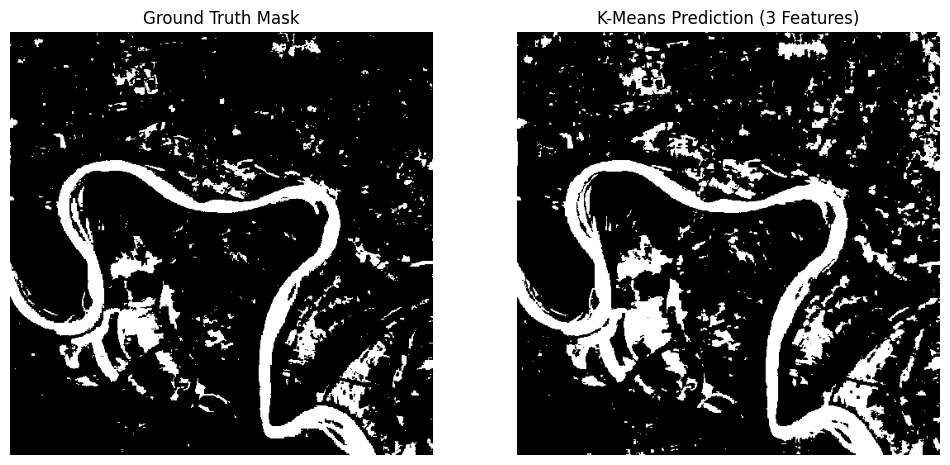

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt

print("Testing K-Means (3 features) on a good validation image...")

# Find a good test image
test_index = 4
#for i, mask_path in enumerate(mask_val_files):
 #   mask_check = load_single_band_image(mask_path)
  #  if 1 in np.unique(mask_check):
   #     test_index = i
        #print(f"Found a good test image at validation index: {test_index}")
       # break

if test_index != -1:
    # 1. Load the good validation image
    s2_image_val = load_s2_image(s2_val_files[test_index])
    mask_val = load_single_band_image(mask_val_files[test_index])

    # 2. Create the 3-feature 'X' data
    indices_val = calculate_indices(s2_image_val)

    X_test_image = np.stack([
        indices_val["S2_MNDWI"], indices_val["S2_NDWI"], indices_val["S2_NDVI"]
    ], axis=0)

    # 3. Flatten
    X_test_flat = X_test_image.reshape(3, -1).T
    y_true_flat = mask_val.flatten()
    valid_indices = (y_true_flat != -1)

    # 4. Predict
    y_pred_flat = kmeans_pipeline_3.predict(X_test_flat)

    # 5. Check for label inversion
    accuracy = accuracy_score(y_true_flat[valid_indices], y_pred_flat[valid_indices])
    if accuracy < 0.5:
        print("Inverting K-Means labels (0 -> 1, 1 -> 0)")
        y_pred_flat = 1 - y_pred_flat

    # 6. Reshape
    y_pred_image = y_pred_flat.reshape(512, 512)

    # 7. Get true label
    y_true_image = np.clip(mask_val, 0, 1)

    # 8. Print report
    print("\n--- Classification Report (K-Means, 3 Features) ---")
    print(classification_report(y_true_flat[valid_indices], y_pred_flat[valid_indices], target_names=['Not Flooded (0)', 'Flooded (1)']))

    # 9. Plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    ax1.imshow(y_true_image, cmap='gray')
    ax1.set_title("Ground Truth Mask")
    ax1.set_axis_off()
    ax2.imshow(y_pred_image, cmap='gray')
    ax2.set_title("K-Means Prediction (3 Features)")
    ax2.set_axis_off()
    plt.show()
else:
    print("ERROR: No validation images found with flooded pixels.")

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
from tqdm import tqdm
import numpy as np

print("Running full evaluation on all 90 validation images (K-Means, 3 Features)...")

all_true_labels = []
all_pred_labels = []

for i in tqdm(range(len(s1_val_files)), desc="Validating K-Means (3-Feat)"):
    try:
        # 1. Load data
        s2_image_val = load_s2_image(s2_val_files[i])
        mask_val = load_single_band_image(mask_val_files[i])

        # 2. Create 3-feature 'X' data
        indices_val = calculate_indices(s2_image_val)

        X_test_image = np.stack([
            indices_val["S2_MNDWI"],
            indices_val["S2_NDWI"],
            indices_val["S2_NDVI"]
        ], axis=0)

        # 3. Flatten
        X_test_flat = X_test_image.reshape(3, -1).T
        y_true_flat = mask_val.flatten()

        # 4. Filter
        valid_indices = (y_true_flat != -1)

        # Predict
        if np.sum(valid_indices) > 0:
            y_pred_flat = kmeans_pipeline_3.predict(X_test_flat[valid_indices])

            all_true_labels.append(y_true_flat[valid_indices])
            all_pred_labels.append(y_pred_flat)

    except Exception as e:
        print(f"Error processing index {i}: {e}")

# 5. Combine results
final_true = np.concatenate(all_true_labels)
final_pred = np.concatenate(all_pred_labels)

# 6. Check for label inversion (0 <-> 1)
accuracy = accuracy_score(final_true, final_pred)
if accuracy < 0.5:
    print("Inverting K-Means labels (0 -> 1, 1 -> 0) for final report...")
    final_pred = 1 - final_pred

# 7. Print the final report
print("\n--- FINAL K-MEANS REPORT (3 Features) ---")
print(classification_report(final_true, final_pred, target_names=['Not Flooded (0)', 'Flooded (1)']))

Running full evaluation on all 90 validation images (K-Means, 3 Features)...


Validating K-Means (3-Feat): 100%|██████████| 90/90 [00:10<00:00,  8.71it/s]



--- FINAL K-MEANS REPORT (3 Features) ---
                 precision    recall  f1-score   support

Not Flooded (0)       1.00      0.95      0.97  18437482
    Flooded (1)       0.65      0.96      0.77   1683163

       accuracy                           0.95  20120645
      macro avg       0.82      0.95      0.87  20120645
   weighted avg       0.97      0.95      0.96  20120645



#K-Means

In [ ]:
import numpy as np
from sklearn.utils import shuffle

# (Assumes all file lists and functions are in memory)

X_samples = []
y_samples_for_testing = [] # K-Means doesn't train on this, but we need it for scoring

num_images_to_sample = 25
pixels_per_image = 2000

print(f"Sampling {pixels_per_image} random pixels from {num_images_to_sample} images (with 6 features)...")

for i in range(num_images_to_sample):
    # 1. Load data
    s1_image = load_s1_image(s1_train_files[i])
    s2_image = load_s2_image(s2_train_files[i])
    mask = load_single_band_image(mask_train_files[i])
    texture = load_single_band_image(texture_train_files[i]) # Load pre-processed texture

    # 2. Create the 6-feature 'X' data
    indices = calculate_indices(s2_image)
    s1_vv = np.nan_to_num(s1_image[0])
    s1_vh = np.nan_to_num(s1_image[1])

    X_full = np.stack([
        s1_vv, s1_vh,
        indices["S2_MNDWI"], indices["S2_NDWI"], indices["S2_NDVI"],
        texture
    ], axis=0)

    # 3. Flatten and filter
    X_flat = X_full.reshape(6, -1).T
    y_flat = mask.flatten()
    valid_indices = (y_flat != -1)
    X_valid = X_flat[valid_indices]
    y_valid = y_flat[valid_indices]

    # 4. Take a *random* sample
    X_shuffled, y_shuffled = shuffle(X_valid, y_valid, random_state=42)
    X_samples.append(X_shuffled[:pixels_per_image])
    y_samples_for_testing.append(y_shuffled[:pixels_per_image]) # Save labels for checking

# 5. Combine all samples
X_train_kmeans = np.vstack(X_samples)
y_true_for_testing = np.concatenate(y_samples_for_testing) # We use this only in Cell 10

print("\n--- Data Ready for K-Means (6 Features) ---")
print(f"X (features) table shape: {X_train_kmeans.shape}")

Sampling 2000 random pixels from 25 images (with 6 features)...

--- Data Ready for K-Means (6 Features) ---
X (features) table shape: (50000, 6)


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

print("Training K-Means classifier (on 6 features)...")

# 1. Create a pipeline
# Step 1: Scale all 6 features (CRITICAL for K-Means)
# Step 2: Run K-Means with 2 clusters (k=2)
kmeans_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('kmeans', KMeans(n_clusters=2, random_state=42, n_init=10))
])

# 2. Train the model (UNSUPERVISED: no y_train)
kmeans_pipeline.fit(X_train_kmeans)

print("--- K-Means Training Complete! ---")

Training K-Means classifier (on 6 features)...
--- K-Means Training Complete! ---


Testing K-Means (6 features) on a good validation image...

--- Classification Report (K-Means, 6 Features) ---
                 precision    recall  f1-score   support

Not Flooded (0)       0.98      0.98      0.98    225493
    Flooded (1)       0.87      0.85      0.86     36649

       accuracy                           0.96    262142
      macro avg       0.92      0.92      0.92    262142
   weighted avg       0.96      0.96      0.96    262142



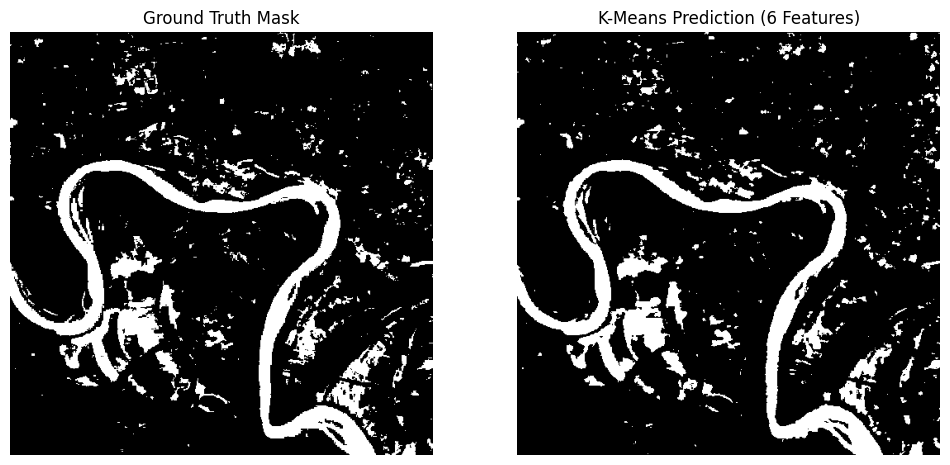

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt

print("Testing K-Means (6 features) on a good validation image...")

# Find a good test image (one with floods)
test_index = 4
#for i, mask_path in enumerate(mask_val_files):
 #   mask_check = load_single_band_image(mask_path)
  #  if 1 in np.unique(mask_check):
   #     test_index = i
    #    print(f"Found a good test image at validation index: {test_index}")
     #   break

if test_index != -1:
    # 1. Load the good validation image
    s1_image_val = load_s1_image(s1_val_files[test_index])
    s2_image_val = load_s2_image(s2_val_files[test_index])
    mask_val = load_single_band_image(mask_val_files[test_index])
    texture_val = load_single_band_image(texture_val_files[test_index])

    # 2. Create the 6-feature 'X' data
    indices_val = calculate_indices(s2_image_val)
    s1_vv_val = np.nan_to_num(s1_image_val[0])
    s1_vh_val = np.nan_to_num(s1_image_val[1])

    X_test_image = np.stack([
        s1_vv_val, s1_vh_val,
        indices_val["S2_MNDWI"], indices_val["S2_NDWI"], indices_val["S2_NDVI"],
        texture_val
    ], axis=0)

    # 3. Flatten
    X_test_flat = X_test_image.reshape(6, -1).T
    y_true_flat = mask_val.flatten()
    valid_indices = (y_true_flat != -1)

    # 4. Predict
    y_pred_flat = kmeans_pipeline.predict(X_test_flat)

    # 5. Check for label inversion
    # Compare the prediction to the truth *only* on the valid pixels
    accuracy = accuracy_score(y_true_flat[valid_indices], y_pred_flat[valid_indices])
    if accuracy < 0.5:
        print("Inverting K-Means labels (0 -> 1, 1 -> 0)")
        y_pred_flat = 1 - y_pred_flat # Flip 0s and 1s

    # 6. Reshape back to an image
    y_pred_image = y_pred_flat.reshape(512, 512)

    # 7. Get the true, clean label
    y_true_image = np.clip(mask_val, 0, 1)

    # 8. Print a performance report
    print("\n--- Classification Report (K-Means, 6 Features) ---")
    print(classification_report(y_true_flat[valid_indices], y_pred_flat[valid_indices], target_names=['Not Flooded (0)', 'Flooded (1)']))

    # 9. Plot the results
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    ax1.imshow(y_true_image, cmap='gray')
    ax1.set_title("Ground Truth Mask")
    ax1.set_axis_off()
    ax2.imshow(y_pred_image, cmap='gray')
    ax2.set_title("K-Means Prediction (6 Features)")
    ax2.set_axis_off()
    plt.show()
else:
    print("ERROR: No validation images found with flooded pixels.")

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
from tqdm import tqdm
import numpy as np

print("Running full evaluation on all 90 validation images (K-Means, 6 Features)...")

all_true_labels = []
all_pred_labels = []

for i in tqdm(range(len(s1_val_files)), desc="Validating K-Means"):
    try:
        # 1. Load
        s1_image = load_s1_image(s1_val_files[i])
        s2_image = load_s2_image(s2_val_files[i])
        mask = load_single_band_image(mask_val_files[i])
        texture = load_single_band_image(texture_val_files[i])

        # 2. Calculate
        indices = calculate_indices(s2_image)
        s1_vv = np.nan_to_num(s1_image[0])
        s1_vh = np.nan_to_num(s1_image[1])

        # 3. Stack
        X_test_image = np.stack([
            s1_vv, s1_vh,
            indices["S2_MNDWI"], indices["S2_NDWI"], indices["S2_NDVI"],
            texture
        ], axis=0)

        # 4. Flatten
        X_test_flat = X_test_image.reshape(6, -1).T
        y_true_flat = mask.flatten()

        # 5. Filter
        valid_indices = (y_true_flat != -1)

        # 6. Predict (Using kmeans_pipeline)
        if np.sum(valid_indices) > 0:
            y_pred_flat = kmeans_pipeline.predict(X_test_flat[valid_indices])

            all_true_labels.append(y_true_flat[valid_indices])
            all_pred_labels.append(y_pred_flat)

    except Exception as e:
        print(f"Error processing index {i}: {e}")

# 7. Combine
final_true = np.concatenate(all_true_labels)
final_pred = np.concatenate(all_pred_labels)

# 8. Check for Label Inversion (Unsupervised correction)
accuracy = accuracy_score(final_true, final_pred)
if accuracy < 0.5:
    print("Note: Inverting K-Means labels (0 -> 1, 1 -> 0) for accuracy...")
    final_pred = 1 - final_pred

print("\n--- FINAL K-MEANS REPORT (Full Validation Set) ---")
print(classification_report(final_true, final_pred, target_names=['Not Flooded (0)', 'Flooded (1)']))

Running full evaluation on all 90 validation images (K-Means, 6 Features)...


Validating K-Means: 100%|██████████| 90/90 [00:09<00:00,  9.95it/s]



--- FINAL K-MEANS REPORT (Full Validation Set) ---
                 precision    recall  f1-score   support

Not Flooded (0)       0.99      0.97      0.98  18437482
    Flooded (1)       0.75      0.89      0.81   1683163

       accuracy                           0.97  20120645
      macro avg       0.87      0.93      0.90  20120645
   weighted avg       0.97      0.97      0.97  20120645



#Baseline Random - Forest

In [ ]:
import numpy as np
from sklearn.utils import shuffle

# (Assumes all file lists and functions are in memory)

X_samples = []
y_samples = []

num_images_to_sample = 25
pixels_per_image = 2000

print(f"Sampling {pixels_per_image} random pixels from {num_images_to_sample} images (with 3 features)...")

for i in range(num_images_to_sample):
    # 1. Load data
    s2_image = load_s2_image(s2_train_files[i])
    mask = load_single_band_image(mask_train_files[i])

    # 2. Create the 3-feature 'X' data
    indices = calculate_indices(s2_image)

    X_full = np.stack([
        indices["S2_MNDWI"],
        indices["S2_NDWI"],
        indices["S2_NDVI"]
    ], axis=0)

    # 3. Flatten and filter
    X_flat = X_full.reshape(3, -1).T
    y_flat = mask.flatten()
    valid_indices = (y_flat != -1)
    X_valid = X_flat[valid_indices]
    y_valid = y_flat[valid_indices]

    # 4. Take a *random* sample
    X_shuffled, y_shuffled = shuffle(X_valid, y_valid, random_state=42)
    X_samples.append(X_shuffled[:pixels_per_image])
    y_samples.append(y_shuffled[:pixels_per_image])

# 5. Combine all samples
X_train_rf_3 = np.vstack(X_samples)
y_train_rf_3 = np.concatenate(y_samples)

print("\n--- Data Ready for Random Forest (3 Features) ---")
print(f"X (features) table shape: {X_train_rf_3.shape}")
print(f"y (labels) vector shape:  {y_train_rf_3.shape}")

Sampling 2000 random pixels from 25 images (with 3 features)...

--- Data Ready for Random Forest (3 Features) ---
X (features) table shape: (50000, 3)
y (labels) vector shape:  (50000,)


In [ ]:
from sklearn.ensemble import RandomForestClassifier

print("Training Random Forest classifier (with 3 features and class_weight)...")

# Create the model
rf_model_3 = RandomForestClassifier(
    n_estimators=100,
    random_state=42,
    n_jobs=-1,
    class_weight='balanced'
)

# Train the model
rf_model_3.fit(X_train_rf_3, y_train_rf_3)

print("--- Random Forest Training Complete! ---")

Training Random Forest classifier (with 3 features and class_weight)...
--- Random Forest Training Complete! ---


Testing Random Forest (3 features) on a good validation image...

--- Classification Report (RF, 3 Features) ---
                 precision    recall  f1-score   support

Not Flooded (0)       0.99      1.00      0.99    225493
    Flooded (1)       0.98      0.92      0.95     36649

       accuracy                           0.99    262142
      macro avg       0.98      0.96      0.97    262142
   weighted avg       0.99      0.99      0.99    262142



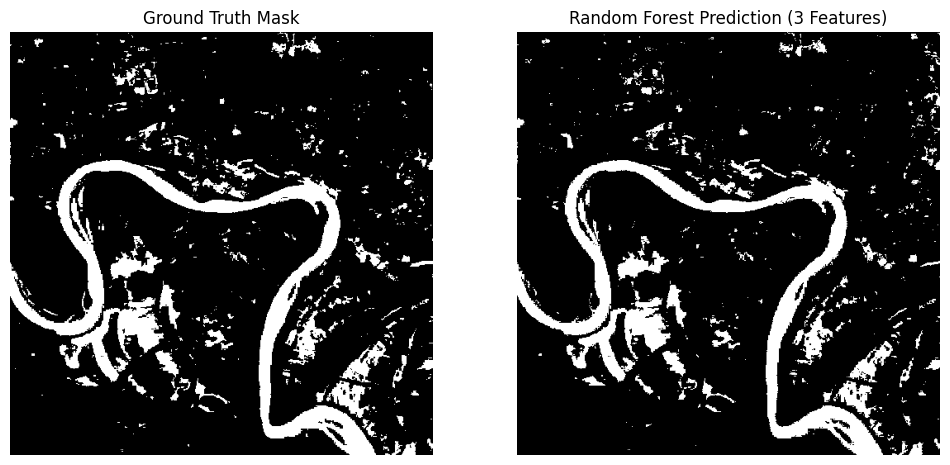

In [ ]:
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

print("Testing Random Forest (3 features) on a good validation image...")

# Find a good test image
test_index = 4
#for i, mask_path in enumerate(mask_val_files):
 #   mask_check = load_single_band_image(mask_path)
  #  if 1 in np.unique(mask_check):
   #     test_index = i
    #    print(f"Found a good test image at validation index: {test_index}")
     #   break

if test_index != -1:
    # 1. Load the good validation image
    s2_image_val = load_s2_image(s2_val_files[test_index])
    mask_val = load_single_band_image(mask_val_files[test_index])

    # 2. Create the 3-feature 'X' data
    indices_val = calculate_indices(s2_image_val)

    X_test_image = np.stack([
        indices_val["S2_MNDWI"], indices_val["S2_NDWI"], indices_val["S2_NDVI"]
    ], axis=0)

    # 3. Flatten
    X_test_flat = X_test_image.reshape(3, -1).T

    # 4. Predict
    y_pred_flat = rf_model_3.predict(X_test_flat)

    # 5. Reshape
    y_pred_image = y_pred_flat.reshape(512, 512)

    # 6. Get true label
    y_true_image = np.clip(mask_val, 0, 1)

    # 7. Print report
    valid_indices = (mask_val.flatten() != -1)
    print("\n--- Classification Report (RF, 3 Features) ---")
    print(classification_report(mask_val.flatten()[valid_indices], y_pred_flat[valid_indices], target_names=['Not Flooded (0)', 'Flooded (1)']))

    # 8. Plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    ax1.imshow(y_true_image, cmap='gray')
    ax1.set_title("Ground Truth Mask")
    ax1.set_axis_off()
    ax2.imshow(y_pred_image, cmap='gray')
    ax2.set_title("Random Forest Prediction (3 Features)")
    ax2.set_axis_off()
    plt.show()
else:
    print("ERROR: No validation images found with flooded pixels.")

In [ ]:
from sklearn.metrics import classification_report
from tqdm import tqdm
import numpy as np

print("Running full evaluation on all 90 validation images (Random Forest, 3 Features)...")

all_true_labels = []
all_pred_labels = []

# Loop through every file in your validation set
for i in tqdm(range(len(s1_val_files)), desc="Validating RF (3-Feat)"):
    try:
        # 1. Load data (Only need S2 and Mask)
        s2_image_val = load_s2_image(s2_val_files[i])
        mask_val = load_single_band_image(mask_val_files[i])

        # 2. Create 3-feature 'X' data
        indices_val = calculate_indices(s2_image_val)

        X_test_image = np.stack([
            indices_val["S2_MNDWI"],
            indices_val["S2_NDWI"],
            indices_val["S2_NDVI"]
        ], axis=0)

        # 3. Flatten
        X_test_flat = X_test_image.reshape(3, -1).T
        y_true_flat = mask_val.flatten()

        # 4. Filter out "no data" pixels
        valid_indices = (y_true_flat != -1)

        # Predict only on valid pixels
        if np.sum(valid_indices) > 0:
            y_pred_flat = rf_model_3.predict(X_test_flat[valid_indices])

            # 5. Save the results
            all_true_labels.append(y_true_flat[valid_indices])
            all_pred_labels.append(y_pred_flat)

    except Exception as e:
        print(f"Error processing index {i}: {e}")

# 6. Combine all results
final_true = np.concatenate(all_true_labels)
final_pred = np.concatenate(all_pred_labels)

# 7. Print the final report
print("\n--- FINAL RANDOM FOREST REPORT (3 Features) ---")
print(classification_report(final_true, final_pred, target_names=['Not Flooded (0)', 'Flooded (1)']))

Running full evaluation on all 90 validation images (Random Forest, 3 Features)...


Validating RF (3-Feat): 100%|██████████| 90/90 [01:47<00:00,  1.20s/it]



--- FINAL RANDOM FOREST REPORT (3 Features) ---
                 precision    recall  f1-score   support

Not Flooded (0)       0.99      1.00      0.99  18437482
    Flooded (1)       0.95      0.88      0.92   1683163

       accuracy                           0.99  20120645
      macro avg       0.97      0.94      0.95  20120645
   weighted avg       0.99      0.99      0.99  20120645



#Random - Forest

In [ ]:
import numpy as np
from sklearn.utils import shuffle

# (Assumes all file lists and functions are in memory)

X_samples = []
y_samples = []

num_images_to_sample = 25
pixels_per_image = 2000

print(f"Sampling {pixels_per_image} random pixels from {num_images_to_sample} images (with 6 features)...")

for i in range(num_images_to_sample):
    # 1. Load data
    s1_image = load_s1_image(s1_train_files[i])
    s2_image = load_s2_image(s2_train_files[i])
    mask = load_single_band_image(mask_train_files[i])
    texture = load_single_band_image(texture_train_files[i]) # Load pre-processed texture

    # 2. Create the 6-feature 'X' data
    indices = calculate_indices(s2_image)
    s1_vv = np.nan_to_num(s1_image[0])
    s1_vh = np.nan_to_num(s1_image[1])

    X_full = np.stack([
        s1_vv, s1_vh,
        indices["S2_MNDWI"], indices["S2_NDWI"], indices["S2_NDVI"],
        texture # Use the loaded texture file
    ], axis=0)

    # 3. Flatten and filter
    X_flat = X_full.reshape(6, -1).T
    y_flat = mask.flatten()
    valid_indices = (y_flat != -1)
    X_valid = X_flat[valid_indices]
    y_valid = y_flat[valid_indices]

    # 4. Take a *random* sample
    X_shuffled, y_shuffled = shuffle(X_valid, y_valid, random_state=42)
    X_samples.append(X_shuffled[:pixels_per_image])
    y_samples.append(y_shuffled[:pixels_per_image])

# 5. Combine all samples
X_train_rf_6 = np.vstack(X_samples)
y_train_rf_6 = np.concatenate(y_samples)

print("\n--- Data Ready for Random Forest (6 Features) ---")
print(f"X (features) table shape: {X_train_rf_6.shape}")
print(f"y (labels) vector shape:  {y_train_rf_6.shape}")

Sampling 2000 random pixels from 25 images (with 6 features)...

--- Data Ready for Random Forest (6 Features) ---
X (features) table shape: (50000, 6)
y (labels) vector shape:  (50000,)


In [ ]:
from sklearn.ensemble import RandomForestClassifier

print("Training Random Forest classifier (with 6 features and class_weight)...")

# Create the model
rf_model_6 = RandomForestClassifier(
    n_estimators=100,
    random_state=42,
    n_jobs=-1,
    class_weight='balanced'  # <-- This is the key parameter
)

# Train the model
rf_model_6.fit(X_train_rf_6, y_train_rf_6)

print("--- Random Forest Training Complete! ---")

Training Random Forest classifier (with 6 features and class_weight)...
--- Random Forest Training Complete! ---


Testing Random Forest (6 features) on a good validation image...

--- Classification Report (RF, 6 Features) ---
                 precision    recall  f1-score   support

Not Flooded (0)       0.99      1.00      0.99    225493
    Flooded (1)       0.98      0.93      0.95     36649

       accuracy                           0.99    262142
      macro avg       0.99      0.96      0.97    262142
   weighted avg       0.99      0.99      0.99    262142



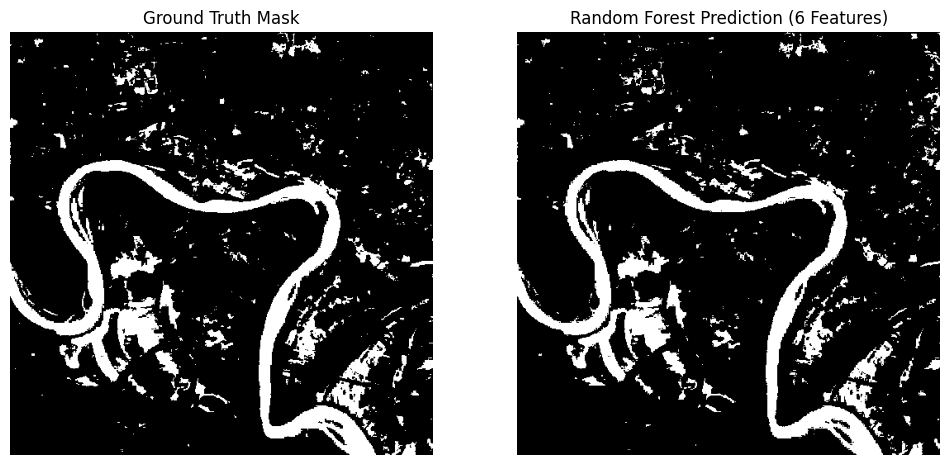

In [ ]:
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

print("Testing Random Forest (6 features) on a good validation image...")

# Find a good test image (one with floods)
test_index = 4
#for i, mask_path in enumerate(mask_val_files):
 #   mask_check = load_single_band_image(mask_path)
  #  if 1 in np.unique(mask_check):
   #     test_index = i
    #    print(f"Found a good test image at validation index: {test_index}")
     #   break

if test_index != -1:
    # 1. Load the good validation image
    s1_image_val = load_s1_image(s1_val_files[test_index])
    s2_image_val = load_s2_image(s2_val_files[test_index])
    mask_val = load_single_band_image(mask_val_files[test_index])
    texture_val = load_single_band_image(texture_val_files[test_index]) # Load texture

    # 2. Create the 6-feature 'X' data
    indices_val = calculate_indices(s2_image_val)
    s1_vv_val = np.nan_to_num(s1_image_val[0])
    s1_vh_val = np.nan_to_num(s1_image_val[1])

    X_test_image = np.stack([
        s1_vv_val, s1_vh_val,
        indices_val["S2_MNDWI"], indices_val["S2_NDWI"], indices_val["S2_NDVI"],
        texture_val
    ], axis=0)

    # 3. Flatten
    X_test_flat = X_test_image.reshape(6, -1).T

    # 4. Predict
    y_pred_flat = rf_model_6.predict(X_test_flat)

    # 5. Reshape back to an image
    y_pred_image = y_pred_flat.reshape(512, 512)

    # 6. Get the true, clean label
    y_true_image = np.clip(mask_val, 0, 1)

    # 7. Print a performance report
    valid_indices = (mask_val.flatten() != -1)
    print("\n--- Classification Report (RF, 6 Features) ---")
    print(classification_report(mask_val.flatten()[valid_indices], y_pred_flat[valid_indices], target_names=['Not Flooded (0)', 'Flooded (1)']))

    # 8. Plot the results
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    ax1.imshow(y_true_image, cmap='gray')
    ax1.set_title("Ground Truth Mask")
    ax1.set_axis_off()
    ax2.imshow(y_pred_image, cmap='gray')
    ax2.set_title("Random Forest Prediction (6 Features)")
    ax2.set_axis_off()
    plt.show()
else:
    print("ERROR: No validation images found with flooded pixels.")

In [ ]:
from sklearn.metrics import classification_report
from tqdm import tqdm
import numpy as np

print("Running full evaluation on all 90 validation images (Random Forest, 6 Features)...")

all_true_labels = []
all_pred_labels = []

# Loop through every file in your validation set
for i in tqdm(range(len(s1_val_files)), desc="Validating RF"):
    try:
        # 1. Load all validation data
        s1_image = load_s1_image(s1_val_files[i])
        s2_image = load_s2_image(s2_val_files[i])
        mask = load_single_band_image(mask_val_files[i])
        texture = load_single_band_image(texture_val_files[i]) # Load pre-processed texture

        # 2. Calculate Indices
        indices = calculate_indices(s2_image)

        # 3. Clean S1 bands
        s1_vv = np.nan_to_num(s1_image[0])
        s1_vh = np.nan_to_num(s1_image[1])

        # 4. Stack 6 Features
        X_test_image = np.stack([
            s1_vv, s1_vh,
            indices["S2_MNDWI"], indices["S2_NDWI"], indices["S2_NDVI"],
            texture
        ], axis=0)

        # 5. Flatten
        X_test_flat = X_test_image.reshape(6, -1).T
        y_true_flat = mask.flatten()

        # 6. Filter out "no data" (-1) pixels
        valid_indices = (y_true_flat != -1)

        # 7. Predict
        if np.sum(valid_indices) > 0:
            y_pred_flat = rf_model_6.predict(X_test_flat[valid_indices])

            # 8. Save results
            all_true_labels.append(y_true_flat[valid_indices])
            all_pred_labels.append(y_pred_flat)

    except Exception as e:
        print(f"Error processing index {i}: {e}")

# 9. Combine all results
final_true = np.concatenate(all_true_labels)
final_pred = np.concatenate(all_pred_labels)

# 10. Print Report
print("\n--- FINAL RANDOM FOREST REPORT (Full Validation Set) ---")
print(classification_report(final_true, final_pred, target_names=['Not Flooded (0)', 'Flooded (1)']))

Running full evaluation on all 90 validation images (Random Forest, 6 Features)...


Validating RF: 100%|██████████| 90/90 [01:40<00:00,  1.12s/it]



--- FINAL RANDOM FOREST REPORT (Full Validation Set) ---
                 precision    recall  f1-score   support

Not Flooded (0)       0.99      1.00      0.99  18437482
    Flooded (1)       0.96      0.88      0.92   1683163

       accuracy                           0.99  20120645
      macro avg       0.97      0.94      0.96  20120645
   weighted avg       0.99      0.99      0.99  20120645



#Baseline U-Net Model

In [ ]:
from sklearn.model_selection import train_test_split
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
import rasterio

# (Assumes s2_files and paired_mask_files lists were created by your
# file-pairing cell)

# --- 1. Split only the 2 lists we need ---
(
    s2_train_files, s2_val_files,
    mask_train_files, mask_val_files
) = train_test_split(
    s2_files, paired_mask_files, # Only split S2 and Masks
    test_size=0.2, random_state=42
)

print(f"Total files:    {len(s2_files)}")
print(f"Training files:   {len(s2_train_files)}")
print(f"Validation files: {len(s2_val_files)}")

# --- 2. Define the 3-Feature Dataset Class ---
class FloodDataset_3Feat(Dataset):
    """
    Custom PyTorch Dataset that loads ONLY S2 images
    and creates a 3-feature (S2 indices) stack.
    """
    def __init__(self, s2_paths, mask_paths):
        self.s2_paths = s2_paths
        self.mask_paths = mask_paths

    def __len__(self):
        return len(self.mask_paths)

    def __getitem__(self, index):

        # 1. Get file paths
        s2_path = self.s2_paths[index]
        mask_path = self.mask_paths[index]

        # 2. Load the raw image data
        s2_image = load_s2_image(s2_path)
        mask = load_single_band_image(mask_path)

        # 3. Calculate S2 indices
        # (Assumes calculate_indices function is defined)
        indices = calculate_indices(s2_image)

        # 4. Create the 'X' (features) by stacking ONLY the 3 indices
        X = np.stack([
            indices["S2_MNDWI"],
            indices["S2_NDWI"],
            indices["S2_NDVI"]
        ], axis=0) # Creates a (3, 512, 512) array

        # 5. Create the 'y' (label)
        y = np.clip(mask, 0, 1)
        y = np.expand_dims(y, axis=0)

        # 6. Convert to PyTorch Tensors
        X_tensor = torch.tensor(X, dtype=torch.float32)
        y_tensor = torch.tensor(y, dtype=torch.float32)

        return X_tensor, y_tensor

# --- 3. Create the 3-Feature DataLoaders ---
BATCH_SIZE = 8
train_dataset_3f = FloodDataset_3Feat(s2_train_files, mask_train_files)
val_dataset_3f = FloodDataset_3Feat(s2_val_files, mask_val_files)

train_loader_3f = DataLoader(train_dataset_3f, batch_size=BATCH_SIZE, shuffle=True)
val_loader_3f = DataLoader(val_dataset_3f, batch_size=BATCH_SIZE, shuffle=False)

# --- 4. Test the Data Loader ---
X_batch, y_batch = next(iter(train_loader_3f))
print(f"\n--- Data Loader Test (3 Features) ---")
print(f"X (features) batch shape: {X_batch.shape}")
print(f"y (labels) batch shape:   {y_batch.shape}")

Total files:    446
Training files:   356
Validation files: 90

--- Data Loader Test (3 Features) ---
X (features) batch shape: torch.Size([8, 3, 512, 512])
y (labels) batch shape:   torch.Size([8, 1, 512, 512])


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )
    def forward(self, x):
        return self.conv(x)

class UNet_3Layer(nn.Module): # Renamed for clarity
    def __init__(self, in_channels, out_channels):

        ### --- THIS IS THE TWEAK --- ###
        # A 3-layer deep model
        features = [64, 128, 256]
        ### ------------------------- ###

        super(UNet_3Layer, self).__init__()
        self.ups = nn.ModuleList()
        self.downs = nn.ModuleList()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Encoder
        for feature in features:
            self.downs.append(DoubleConv(in_channels, feature))
            in_channels = feature
        # Decoder
        for feature in reversed(features):
            self.ups.append(
                nn.ConvTranspose2d(
                    feature*2, feature, kernel_size=2, stride=2,
                )
            )
            self.ups.append(DoubleConv(feature*2, feature))

        # Bottleneck
        self.bottleneck = DoubleConv(features[-1], features[-1]*2)
        # Final output
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x):
        skip_connections = []
        for down in self.downs:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)
        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]
        for idx in range(0, len(self.ups), 2):
            x = self.ups[idx](x)
            skip_connection = skip_connections[idx//2]
            concat_skip = torch.cat((skip_connection, x), dim=1)
            x = self.ups[idx+1](concat_skip)
        return self.final_conv(x)

print("U-Net model definition (3-Layer) is ready.")

U-Net model definition (3-Layer) is ready.


In [ ]:
import torch.optim as optim
from tqdm import tqdm
from sklearn.metrics import classification_report

# --- 1. Define the Dice Loss Function ---
class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
    def forward(self, logits, targets):
        probs = torch.sigmoid(logits)
        probs_flat = probs.view(-1)
        targets_flat = targets.view(-1)
        intersection = (probs_flat * targets_flat).sum()
        dice_coeff = (2. * intersection + self.smooth) / (probs_flat.sum() + targets_flat.sum() + self.smooth)
        return 1 - dice_coeff
print("DiceLoss function is defined.")

# --- 2. Set Hyperparameters ---
LEARNING_RATE = 1e-4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
NUM_EPOCHS = 20
BATCH_SIZE = 8 # This model is smaller, 8 should be fine
print(f"Using device: {DEVICE}, Batch Size: {BATCH_SIZE}, Epochs: {NUM_EPOCHS}")

# --- 3. Initialize Model, Loss, and Optimizer ---
# --- THIS IS THE KEY CHANGE ---
model_3f = UNet_3Layer(in_channels=3, out_channels=1).to(DEVICE) # 3 in_channels
# ------------------------------
loss_fn = DiceLoss()
optimizer = optim.Adam(model_3f.parameters(), lr=LEARNING_RATE)

# (Uses train_loader_3f and val_loader_3f from Cell 1)
print("DataLoaders are ready.")

# --- 4. Run the Training Loop ---
print(f"Starting U-Net training for {NUM_EPOCHS} epochs...")
for epoch in range(NUM_EPOCHS):
    model_3f.train()
    loop = tqdm(train_loader_3f, desc=f"Epoch [{epoch+1}/{NUM_EPOCHS}] Training")
    for batch_idx, (X_batch, y_batch) in enumerate(loop):
        X_batch, y_batch = X_batch.to(DEVICE), y_batch.to(DEVICE)
        preds = model_3f(X_batch)
        loss = loss_fn(preds, y_batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        loop.set_postfix(loss=loss.item())

    # --- Validation Loop ---
    model_3f.eval()
    epoch_val_loss = 0.0
    with torch.no_grad():
        loop_val = tqdm(val_loader_3f, desc=f"Epoch [{epoch+1}/{NUM_EPOCHS}] Validation")
        for X_batch, y_batch in loop_val:
            X_batch, y_batch = X_batch.to(DEVICE), y_batch.to(DEVICE)
            preds = model_3f(X_batch)
            loss = loss_fn(preds, y_batch)
            epoch_val_loss += loss.item()
            loop_val.set_postfix(loss=loss.item())
    avg_val_loss = epoch_val_loss / len(val_loader_3f)
    print(f"\nEpoch {epoch+1} Summary: Avg Val Loss: {avg_val_loss:.4f}\n")
print("--- U-Net Training Complete! ---")

DiceLoss function is defined.
Using device: cuda, Batch Size: 8, Epochs: 20
DataLoaders are ready.
Starting U-Net training for 20 epochs...


Epoch [1/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.26it/s, loss=0.98]



Epoch 1 Summary: Avg Val Loss: 0.7166



Epoch [2/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.28it/s, loss=0.973]



Epoch 2 Summary: Avg Val Loss: 0.6928



Epoch [3/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.25it/s, loss=0.969]



Epoch 3 Summary: Avg Val Loss: 0.6722



Epoch [4/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.28it/s, loss=0.964]



Epoch 4 Summary: Avg Val Loss: 0.6591



Epoch [5/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.25it/s, loss=0.963]



Epoch 5 Summary: Avg Val Loss: 0.6488



Epoch [6/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.27it/s, loss=0.959]



Epoch 6 Summary: Avg Val Loss: 0.6539



Epoch [7/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.27it/s, loss=0.955]



Epoch 7 Summary: Avg Val Loss: 0.6168



Epoch [8/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.26it/s, loss=0.949]



Epoch 8 Summary: Avg Val Loss: 0.6086



Epoch [9/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.28it/s, loss=0.946]



Epoch 9 Summary: Avg Val Loss: 0.5868



Epoch [10/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.28it/s, loss=0.948]



Epoch 10 Summary: Avg Val Loss: 0.5682



Epoch [11/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.29it/s, loss=0.939]



Epoch 11 Summary: Avg Val Loss: 0.5492



Epoch [12/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.27it/s, loss=0.939]



Epoch 12 Summary: Avg Val Loss: 0.5530



Epoch [13/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.29it/s, loss=0.934]



Epoch 13 Summary: Avg Val Loss: 0.5210



Epoch [14/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.27it/s, loss=0.924]



Epoch 14 Summary: Avg Val Loss: 0.5148



Epoch [15/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.28it/s, loss=0.915]



Epoch 15 Summary: Avg Val Loss: 0.4904



Epoch [16/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.27it/s, loss=0.919]



Epoch 16 Summary: Avg Val Loss: 0.4689



Epoch [17/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.28it/s, loss=0.9]



Epoch 17 Summary: Avg Val Loss: 0.4292



Epoch [18/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.30it/s, loss=0.889]



Epoch 18 Summary: Avg Val Loss: 0.4456



Epoch [19/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.29it/s, loss=0.892]



Epoch 19 Summary: Avg Val Loss: 0.4388



Epoch [20/20] Validation: 100%|██████████| 12/12 [00:09<00:00,  1.32it/s, loss=0.883]


Epoch 20 Summary: Avg Val Loss: 0.4206

--- U-Net Training Complete! ---


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

print("Running full evaluation on all 90 validation images (for 3-Feature U-Net)...")

all_true_labels = []
all_pred_labels = []

model_3f.eval()
with torch.no_grad():

    for X_batch, y_batch in tqdm(val_loader_3f, desc="Validating 3-Feat U-Net"):
        X_batch = X_batch.to(DEVICE)

        y_pred_logits = model_3f(X_batch)
        y_pred_probs = torch.sigmoid(y_pred_logits)
        y_pred = (y_pred_probs > 0.5).cpu().numpy()

        y_true = y_batch.cpu().numpy()

        y_true_flat = y_true.flatten()
        y_pred_flat = y_pred.flatten()

        valid_indices = (y_true_flat != -1)

        all_true_labels.append(y_true_flat[valid_indices])
        all_pred_labels.append(y_pred_flat[valid_indices])

# --- After the loop ---

final_true = np.concatenate(all_true_labels)
final_pred = np.concatenate(all_pred_labels)

# Print the final, most reliable report
print("\n--- FINAL CLASSIFICATION REPORT (U-Net, 3 Features, 20 Epochs) ---")
print(classification_report(final_true, final_pred, target_names=['Not Flooded (0)', 'Flooded (1)']))

Running full evaluation on all 90 validation images (for 3-Feature U-Net)...


Validating 3-Feat U-Net: 100%|██████████| 12/12 [00:09<00:00,  1.28it/s]



--- FINAL CLASSIFICATION REPORT (U-Net, 3 Features, 20 Epochs) ---
                 precision    recall  f1-score   support

Not Flooded (0)       0.99      0.99      0.99  21909797
    Flooded (1)       0.87      0.90      0.89   1683163

       accuracy                           0.98  23592960
      macro avg       0.93      0.95      0.94  23592960
   weighted avg       0.98      0.98      0.98  23592960



#U-Net model (Deep Learning)

In [ ]:
import os
import rasterio
from rasterio.transform import from_origin
from tqdm import tqdm

print("Starting pre-processing for texture features...")

# 1. Define the path for our new pre-processed files
base_dir = "/content/Sen1Floods11_HandLabeled"
texture_dir = os.path.join(base_dir, "S1_VH_Texture")
os.makedirs(texture_dir, exist_ok=True)
print(f"Created directory: {texture_dir}")

# 2. Loop through all 446 S1 files
for s1_path in tqdm(s1_files, desc="Processing images"):
    try:
        # Load the original S1 image
        with rasterio.open(s1_path) as src:
            s1_image = src.read()
            # Get metadata to save the new file correctly
            transform = src.transform
            crs = src.crs

        # Clean the VH band (index 1)
        s1_vh_band = np.nan_to_num(s1_image[1])

        # Calculate the slow texture feature
        texture_image = calculate_texture_features(s1_vh_band)

        # 3. Save the new texture image

        # Get the original filename and create a new one
        base_name = os.path.basename(s1_path) # e.g., "Bolivia_103757_S1Hand.tif"
        new_name = base_name.replace("S1Hand.tif", "S1VHTexture.tif")
        save_path = os.path.join(texture_dir, new_name)

        # Write the new file to disk
        with rasterio.open(
            save_path,
            'w',
            driver='GTiff',
            height=texture_image.shape[0],
            width=texture_image.shape[1],
            count=1,
            dtype=texture_image.dtype,
            crs=crs,
            transform=transform,
        ) as dst:
            dst.write(texture_image, 1)

    except Exception as e:
        print(f"Error processing {s1_path}: {e}")

print("\n--- Pre-processing complete! ---")

Starting pre-processing for texture features...
Created directory: /content/Sen1Floods11_HandLabeled/S1_VH_Texture


Processing images:   2%|▏         | 11/446 [00:55<34:44,  4.79s/it]Exception ignored in garbage collection:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py", line 3600, in _std_dispatcher
    def _std_dispatcher(a, axis=None, dtype=None, out=None, ddof=None,
    
SystemError: <function _std_dispatcher at 0x7ec415190180> returned a result with an exception set
Processing images:   6%|▌         | 25/446 [02:04<34:07,  4.86s/it]Exception ignored in garbage collection:
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py", line 3600, in _std_dispatcher
    def _std_dispatcher(a, axis=None, dtype=None, out=None, ddof=None,
    
SystemError: <function _std_dispatcher at 0x7ec415190180> returned a result with an exception set
Processing images:   6%|▌         | 27/446 [02:14<34:39,  4.96s/it]

In [ ]:
from sklearn.model_selection import train_test_split
import glob

# 1. Find all our new texture files
texture_dir = "/content/Sen1Floods11_HandLabeled/S1_VH_Texture"
texture_files = glob.glob(os.path.join(texture_dir, "**/*.tif"), recursive=True)
texture_files.sort() # Sort to ensure matching

# We must also re-sort the other lists to guarantee they align
s1_files.sort()
s2_files.sort()
paired_mask_files.sort()

# 2. Split all 4 lists together
(
    s1_train_files, s1_val_files,
    s2_train_files, s2_val_files,
    mask_train_files, mask_val_files,
    texture_train_files, texture_val_files # <-- New list
) = train_test_split(
    s1_files, s2_files, paired_mask_files, texture_files, # <-- 4 lists
    test_size=0.2, random_state=42
)

print(f"Total files:    {len(s1_files)}")
print(f"Training files:   {len(s1_train_files)}")
print(f"Validation files: {len(s1_val_files)}")
print(f"Total texture files found: {len(texture_files)}")

Total files:    446
Training files:   356
Validation files: 90
Total texture files found: 446


In [ ]:
import torch
import torch.optim as optim
from tqdm import tqdm
from sklearn.metrics import classification_report
import torch.nn as nn
import torch.nn.functional as F

# --- 1. Define the Dice Loss Function ---
class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
    def forward(self, logits, targets):
        probs = torch.sigmoid(logits)
        probs_flat = probs.view(-1)
        targets_flat = targets.view(-1)
        intersection = (probs_flat * targets_flat).sum()
        dice_coeff = (2. * intersection + self.smooth) / (probs_flat.sum() + targets_flat.sum() + self.smooth)
        return 1 - dice_coeff
print("DiceLoss function is defined.")

# --- 2. Set Hyperparameters ---
LEARNING_RATE = 1e-4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

### --- THIS IS THE CHANGE --- ###
NUM_EPOCHS = 20
### -------------------------- ###

BATCH_SIZE = 8
print(f"Using device: {DEVICE}, Batch Size: {BATCH_SIZE}, Epochs: {NUM_EPOCHS}")

# --- 3. Initialize Model, Loss, and Optimizer ---
# (Assumes the 4-layer UNet class is already defined in a previous cell)
model = UNet(in_channels=6, out_channels=1).to(DEVICE) # 6 in_channels
loss_fn = DiceLoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

# --- 4. Re-create DataLoaders ---
# (Assumes train_dataset and val_dataset are defined)
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
print("DataLoaders are ready.")

DiceLoss function is defined.
Using device: cuda, Batch Size: 8, Epochs: 20
DataLoaders are ready.


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )
    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, in_channels, out_channels, features=[64, 128, 256, 512]):

        # We are using the stable 4-layer model
        features = [64, 128, 256, 512]

        super(UNet, self).__init__()
        self.ups = nn.ModuleList()
        self.downs = nn.ModuleList()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # 1. Down-sampling part (Encoder)
        for feature in features:
            self.downs.append(DoubleConv(in_channels, feature))
            in_channels = feature
        # 2. Up-sampling part (Decoder)
        for feature in reversed(features):
            self.ups.append(
                nn.ConvTranspose2d(
                    feature*2, feature, kernel_size=2, stride=2,
                )
            )
            self.ups.append(DoubleConv(feature*2, feature))

        # 3. Bottom layer of the "U"
        self.bottleneck = DoubleConv(features[-1], features[-1]*2)
        # 4. Final output layer
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def forward(self, x):
        skip_connections = []
        for down in self.downs:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)
        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]
        for idx in range(0, len(self.ups), 2):
            x = self.ups[idx](x)
            skip_connection = skip_connections[idx//2]
            concat_skip = torch.cat((skip_connection, x), dim=1)
            x = self.ups[idx+1](concat_skip)
        return self.final_conv(x)

print("U-Net model definition (4-Layer) is ready.")

U-Net model definition (4-Layer) is ready.


In [ ]:
import torch

# --- 5. Run the Training Loop ---
print(f"Starting U-Net training for {NUM_EPOCHS} epochs...")
for epoch in range(NUM_EPOCHS):
    model.train()
    loop = tqdm(train_loader, desc=f"Epoch [{epoch+1}/{NUM_EPOCHS}] Training")
    for batch_idx, (X_batch, y_batch) in enumerate(loop):
        X_batch, y_batch = X_batch.to(DEVICE), y_batch.to(DEVICE)
        preds = model(X_batch)
        loss = loss_fn(preds, y_batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        loop.set_postfix(loss=loss.item())

    # --- Validation Loop ---
    model.eval()
    epoch_val_loss = 0.0
    with torch.no_grad():
        loop_val = tqdm(val_loader, desc=f"Epoch [{epoch+1}/{NUM_EPOCHS}] Validation")
        for X_batch, y_batch in loop_val:
            X_batch, y_batch = X_batch.to(DEVICE), y_batch.to(DEVICE)
            preds = model(X_batch)
            loss = loss_fn(preds, y_batch)
            epoch_val_loss += loss.item()
            loop_val.set_postfix(loss=loss.item())
    avg_val_loss = epoch_val_loss / len(val_loader)
    print(f"\nEpoch {epoch+1} Summary: Avg Val Loss: {avg_val_loss:.4f}\n")
print("--- U-Net Training Complete! ---")

Starting U-Net training for 20 epochs...


Epoch [1/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.07s/it, loss=0.975]



Epoch 1 Summary: Avg Val Loss: 0.6917



Epoch [2/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.07s/it, loss=0.968]



Epoch 2 Summary: Avg Val Loss: 0.6583



Epoch [3/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.07s/it, loss=0.959]



Epoch 3 Summary: Avg Val Loss: 0.6249



Epoch [4/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.05s/it, loss=0.946]



Epoch 4 Summary: Avg Val Loss: 0.6349



Epoch [5/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.04s/it, loss=0.951]



Epoch 5 Summary: Avg Val Loss: 0.5878



Epoch [6/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.06s/it, loss=0.956]



Epoch 6 Summary: Avg Val Loss: 0.5806



Epoch [7/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.06s/it, loss=0.932]



Epoch 7 Summary: Avg Val Loss: 0.5483



Epoch [8/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.06s/it, loss=0.96]



Epoch 8 Summary: Avg Val Loss: 0.5436



Epoch [9/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.07s/it, loss=0.947]



Epoch 9 Summary: Avg Val Loss: 0.5260



Epoch [10/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.04s/it, loss=0.948]



Epoch 10 Summary: Avg Val Loss: 0.5416



Epoch [11/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.05s/it, loss=0.897]



Epoch 11 Summary: Avg Val Loss: 0.4780



Epoch [12/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.06s/it, loss=0.91]



Epoch 12 Summary: Avg Val Loss: 0.4473



Epoch [13/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.06s/it, loss=0.886]



Epoch 13 Summary: Avg Val Loss: 0.4514



Epoch [14/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.05s/it, loss=0.879]



Epoch 14 Summary: Avg Val Loss: 0.4480



Epoch [15/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.05s/it, loss=0.904]



Epoch 15 Summary: Avg Val Loss: 0.4509



Epoch [16/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.07s/it, loss=0.85]



Epoch 16 Summary: Avg Val Loss: 0.4634



Epoch [17/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.06s/it, loss=0.857]



Epoch 17 Summary: Avg Val Loss: 0.4120



Epoch [18/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.06s/it, loss=0.851]



Epoch 18 Summary: Avg Val Loss: 0.4081



Epoch [19/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.04s/it, loss=0.91]



Epoch 19 Summary: Avg Val Loss: 0.4250



Epoch [20/20] Validation: 100%|██████████| 12/12 [00:12<00:00,  1.05s/it, loss=0.803]


Epoch 20 Summary: Avg Val Loss: 0.3678

--- U-Net Training Complete! ---


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

print("Running full evaluation on all 90 validation images...")

# We'll store all the "true" labels and "predicted" labels here
all_true_labels = []
all_pred_labels = []

model.eval() # Set model to evaluation mode
with torch.no_grad(): # Disable gradient calculations

    # Loop through every batch in the validation loader
    for X_batch, y_batch in tqdm(val_loader, desc="Validating"):
        # Move data to GPU
        X_batch = X_batch.to(DEVICE)

        # 1. Predict
        y_pred_logits = model(X_batch)
        y_pred_probs = torch.sigmoid(y_pred_logits)
        # Convert to 0/1 labels
        y_pred = (y_pred_probs > 0.5).cpu().numpy()

        # 2. Get true labels
        y_true = y_batch.cpu().numpy()

        # 3. Flatten and filter out "no data" (-1) pixels
        y_true_flat = y_true.flatten()
        y_pred_flat = y_pred.flatten()

        valid_indices = (y_true_flat != -1)

        # 4. Save the valid results
        all_true_labels.append(y_true_flat[valid_indices])
        all_pred_labels.append(y_pred_flat[valid_indices])

# --- After the loop ---

# 5. Combine all results into two giant vectors
final_true = np.concatenate(all_true_labels)
final_pred = np.concatenate(all_pred_labels)

# 6. Print the final, most reliable report
print("\n--- FINAL CLASSIFICATION REPORT (U-Net, Full Validation Set) ---")
print(classification_report(final_true, final_pred, target_names=['Not Flooded (0)', 'Flooded (1)']))

Running full evaluation on all 90 validation images...


Validating: 100%|██████████| 12/12 [00:12<00:00,  1.06s/it]



--- FINAL CLASSIFICATION REPORT (U-Net, Full Validation Set) ---
                 precision    recall  f1-score   support

Not Flooded (0)       0.99      0.98      0.99  21909797
    Flooded (1)       0.76      0.91      0.83   1683163

       accuracy                           0.97  23592960
      macro avg       0.88      0.95      0.91  23592960
   weighted avg       0.98      0.97      0.97  23592960

